
# 🧠 Deep Convolutional Neural Networks (CNNs) for Image Classification

## 📌 Project Overview

In this project, you will **implement and design a deep convolutional neural network (CNN)** for an image classification task using the **CIFAR-10** dataset. The goal is to become familiar with the architecture of CNNs and their practical use in classifying small images.

By the end of this project, you will have developed the **skills to design and implement convolutional neural networks** for visual recognition tasks.

---

## 🧬 What are Convolutional Neural Networks?

Convolutional Neural Networks (CNNs) are a type of deep learning model specifically designed to work with image data. CNNs automatically learn spatial hierarchies of features through the use of convolutional layers, which makes them highly effective for visual tasks such as classification, detection, and segmentation.

### 🔍 Key Components of CNNs:

- **Convolutional Layers**: Detect local patterns in the input such as edges, textures, and shapes.
- **Activation Functions**:  used to introduce non-linearity.
- **Pooling Layers**: Downsample feature maps to reduce dimensionality and computation ().
- **Fully Connected Layers**: Used for final decision-making in the network.
- **Regularization Techniques**: Such as Dropout or Batch Normalization to prevent overfitting and improve generalization.

---

## 🧪 Project Tasks

In this project, you will:

1. **Implement one of the deep CNN architectures** (you can choose a custom design or a simplified version of known models ResNet).
2. **Design a convolutional network for the CIFAR-10 image classification task**.
3. **Use the provided utility functions** to:
   - Train your model on the CIFAR-10 training data
   - Evaluate its performance on the test set
   - Report the achieved classification accuracy

---

## 📊 Dataset: CIFAR-10

The [CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html) consists of 60,000 32x32 color images in 10 different classes, with 6,000 images per class. There are 50,000 training images and 10,000 test images.

The 10 classes are:

- airplane
- automobile
- bird
- cat
- deer
- dog
- frog
- horse
- ship
- truck

---

## 🎯 Learning Outcome

By the end of this project, you will be able to:

- Understand and build the components of CNN architectures
- Train and evaluate CNNs on standard image datasets
- Tune your model for better performance
- Apply deep CNNs to similar image classification problems

---

> ✅ Tip: Start simple and iterate! Begin with a basic architecture and gradually add layers, regularization, and other improvements.


## Libraries

First, let's download the necessary libraries that are used throughout the assignment.

In [3]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
import os
import math
import random
import time
import zipfile
import gzip
import shutil
import tarfile
import requests
import copy
import gc


import numpy as np
from sklearn.manifold import TSNE

import torch
import torch.nn as nn
import torch.nn.functional as F

import torch.optim as optim
from torch.utils.data import DataLoader

import torchvision
from torchvision import transforms
import torchvision.datasets as datasets

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import correlate2d
from collections import Counter


from tqdm.notebook import tqdm, trange
from tqdm import tqdm 
from PIL import Image
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## Helper Functioins


In [4]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
def clear_gpu_memory():
    """
    Clears the GPU memory to free up space for training new models.
    Call this function after each model run in a Kaggle notebook.
    """
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    gc.collect()

In [5]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
def set_seed(seed=None, seed_torch=True):
  """
  Function that controls randomness.
  NumPy and random modules must be imported.

  Args:
    seed : Integer
      A non-negative integer that defines the random state. Default is `None`.
    seed_torch : Boolean
      If `True` sets the random seed for pytorch tensors, so pytorch module
      must be imported. Default is `True`.

  Returns:
    Nothing.
  """
  if seed is None:
    seed = np.random.choice(2 ** 32)
  random.seed(seed)
  np.random.seed(seed)
  if seed_torch:
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
  print(f'Random seed {seed} has been set.')

def seed_worker(worker_id):
  """
  DataLoader will reseed workers following randomness in
  multi-process data loading algorithm.

  Args:
    worker_id: integer
      ID of subprocess to seed. 0 means that
      the data will be loaded in the main process
  """
  worker_seed = torch.initial_seed() % 2**32
  np.random.seed(worker_seed)
  random.seed(worker_seed)

In [6]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
def set_device():
  """
  Set the device. CUDA if available, CPU otherwise
  """
  device = "cuda" if torch.cuda.is_available() else "cpu"
  if device != "cuda":
    print("WARNING: For this notebook to perform best, "
        "if possible, in the menu under `Runtime` -> "
        "`Change runtime type.`  select `GPU` ")
  else:
    print("GPU is enabled in this notebook.")
  return device


In [7]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
SEED = 1404
set_seed(seed=SEED)
DEVICE = set_device()

Random seed 1404 has been set.
GPU is enabled in this notebook.


In [8]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
def get_cifar10_dataset(
    augmentation_fn,
    augment = False,
    download = False,
    seed = 0
):
    """
    Helper function to get CIFAR-10 dataset

    Args:
      augment: boolean
        If True, apply augmentation to training data
      augmentation_fn: callable
        Function that returns a list of augmentation transforms
      download: boolean
        If True, download dataset
      seed: int
        Set seed for reproducibility [default: 0]

    Returns:
      train_data: torch.dataset
        Training data
      validation_data: torch.dataset
        Validation data
      test_data: torch.dataset
        Test data
    """
    basic_transforms = [
        transforms.ToTensor(),
        transforms.Normalize((0.48, 0.48, 0.48), (0.20, 0.20, 0.20))
    ]
    
    if augment:
        aug_transforms = augmentation_fn()
        train_transform = transforms.Compose(aug_transforms + basic_transforms)
    else:
        train_transform = transforms.Compose(basic_transforms)
    
    test_transform = transforms.Compose(basic_transforms)

    train_data = datasets.CIFAR10(root='.', download=download, train=True, transform=train_transform)
    test_data = datasets.CIFAR10(root='.', download=download, train=False, transform=test_transform)

    validation_data =  test_data
    return train_data, validation_data, test_data


def get_data_loaders(
    train_dataset,
    validation_dataset,
    test_dataset,
    seed,
):
    """
    Helper function to fetch dataloaders

    Args:
      train_dataset: torch.dataset
        Training data
      validation_dataset: torch.dataset
        Validation data
      test_dataset: torch.dataset
        Test data
      seed: int
        Set seed for reproducibility
      batch_size: int
        Batch size [default: 64]

    Returns:
      train_loader: DataLoader
      validation_loader: DataLoader
      test_loader: DataLoader
    """
    g_seed = torch.Generator()
    g_seed.manual_seed(seed)
    
    train_loader = DataLoader(
        train_dataset, batch_size = 512, shuffle = True,
        num_workers=2, worker_init_fn=seed_worker, generator=g_seed
    )
    validation_loader = DataLoader(
        validation_dataset, batch_size = 256, shuffle = True,
        num_workers=2, worker_init_fn=seed_worker, generator=g_seed
    )
    test_loader = DataLoader(
        test_dataset, batch_size = 256, shuffle = True,
        num_workers=2, worker_init_fn=seed_worker, generator=g_seed
    )
    return train_loader, validation_loader, test_loader
    

In [9]:
def get_augmentation_transforms():
    """
    Placeholder for Augmentation Transforms for CIFAR-10

    Returns:
      augmentation_transforms: list
        List of augmentation transforms to be filled by user
    """
    
    # TODO: Fill this list with desired torchvision transforms
        
    augmentation_transforms = [ transforms.RandomCrop(32, padding=4, padding_mode="reflect"),
    transforms.RandomHorizontalFlip(p=0.5), transforms.RandAugment(num_ops=2, magnitude=9),]

    
    return augmentation_transforms

set_seed(seed=SEED)

train_data, validation_data, test_data = get_cifar10_dataset( augmentation_fn = get_augmentation_transforms , augment = True  , download = True , seed = SEED)

Random seed 1404 has been set.


100%|██████████| 170M/170M [00:04<00:00, 40.8MB/s] 


In [10]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
set_seed(seed=SEED)
train_loader, validation_loader , test_loader = get_data_loaders(train_data , validation_data , test_data , seed=SEED)

Random seed 1404 has been set.


## Visualization

100%|██████████| 170M/170M [00:05<00:00, 33.9MB/s] 


=== Total sample counts per class ===
Class 'plane' (label 0): 5000 samples
Class 'car  ' (label 1): 5000 samples
Class 'bird ' (label 2): 5000 samples
Class 'cat  ' (label 3): 5000 samples
Class 'deer ' (label 4): 5000 samples
Class 'dog  ' (label 5): 5000 samples
Class 'frog ' (label 6): 5000 samples
Class 'horse' (label 7): 5000 samples
Class 'ship ' (label 8): 5000 samples
Class 'truck' (label 9): 5000 samples

=== Sampled counts (up to 5 per class) ===
Class 'plane': 5 samples
Class 'car  ': 5 samples
Class 'bird ': 5 samples
Class 'cat  ': 5 samples
Class 'deer ': 5 samples
Class 'dog  ': 5 samples
Class 'frog ': 5 samples
Class 'horse': 5 samples
Class 'ship ': 5 samples
Class 'truck': 5 samples
Smallest sampled count is 5 for: plane, car, bird, cat, deer, dog, frog, horse, ship, truck


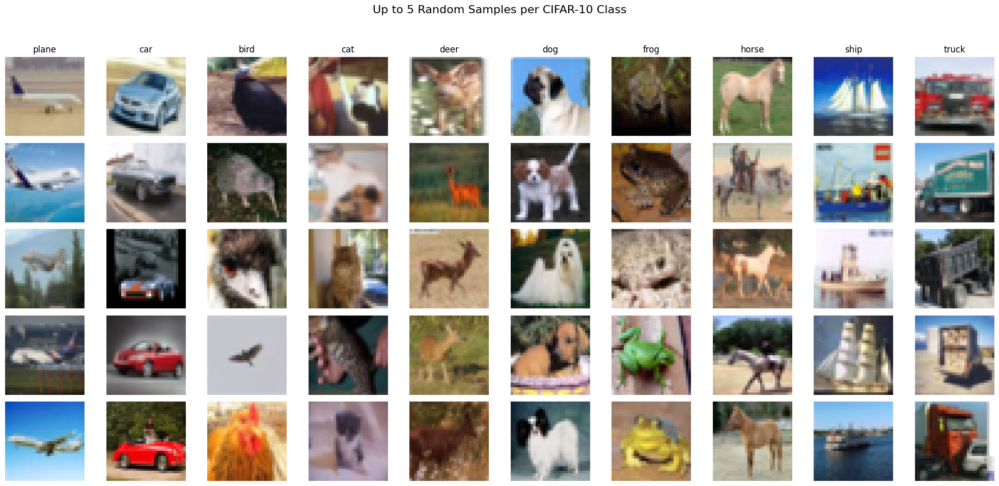

In [11]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
classes = [
    'plane', 'car', 'bird', 'cat', 'deer',
    'dog', 'frog', 'horse', 'ship', 'truck'
]

train_dataset = torchvision.datasets.CIFAR10(
    root='./data',
    train=True,
    download=True,
    transform=transforms.ToTensor()
)

# 1) Count total samples per class using Counter on targets list
total_counts = Counter(train_dataset.targets)

print("=== Total sample counts per class ===")
for idx, cls_name in enumerate(classes):
    print(f"Class '{cls_name:5s}' (label {idx}): {total_counts[idx]} samples")

# 2) Randomly sample up to 5 images per class
# Prepare empty lists for each class
sampled_images = [[] for _ in classes]

# Generate 1000 random indices from the dataset
random_idx = random.sample(range(len(train_dataset)), 1000)

for idx in random_idx:
    # If every class already has 5 images, stop early
    if all(len(imgs) >= 5 for imgs in sampled_images):
        break
    image, label = train_dataset[idx]
    # If this class has fewer than 5, append the image
    if len(sampled_images[label]) < 5:
        sampled_images[label].append(image)

# Compute how many we actually got per class
sampled_counts = [len(imgs) for imgs in sampled_images]
min_count = min(sampled_counts)
rarest = [classes[i] for i, c in enumerate(sampled_counts) if c == min_count]

print("\n=== Sampled counts (up to 5 per class) ===")
for cls, cnt in zip(classes, sampled_counts):
    print(f"Class '{cls:5s}': {cnt} samples")
print(f"Smallest sampled count is {min_count} for: {', '.join(rarest)}")

# 3) Plot the sampled images: 5 rows (one per image index), 10 columns (one per class)
fig, axes = plt.subplots(5, 10, figsize=(20, 10))
fig.suptitle("Up to 5 Random Samples per CIFAR-10 Class", fontsize=16)

for cls_idx in range(10):
    for img_idx in range(len(sampled_images[cls_idx])):
        ax = axes[img_idx, cls_idx]
        # permute from (C,H,W) to (H,W,C) and convert to numpy
        ax.imshow(sampled_images[cls_idx][img_idx].permute(1, 2, 0).numpy())
        ax.axis('off')
        if img_idx == 0:
            ax.set_title(classes[cls_idx], fontsize=12)
    # Hide any unused subplots if fewer than 5 images
    for empty_row in range(len(sampled_images[cls_idx]), 5):
        axes[empty_row, cls_idx].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [12]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
def train(
    model,
    device,
    train_loader,
    validation_loader,
    epochs,
    patience=10,
    lr=0.01,
    early_stopping=True,
    scheduler_type: str = None,
    scheduler_params: dict = None,
    scheduler_enable: bool = True,
    return_best: bool = True,  # If True, return the best model state; otherwise return the last model state
):
    """
    Train a PyTorch model with optional early stopping and learning rate scheduler.

    Args:
      model (nn.Module): The neural network to train.
      device (torch.device): Device to run training on (cpu or cuda).
      train_loader (DataLoader): DataLoader for training data.
      validation_loader (DataLoader): DataLoader for validation data.
      epochs (int): Maximum number of epochs to train.
      patience (int): Number of epochs with no improvement after which training stops.
      lr (float): Learning rate for the optimizer.
      scheduler_type (str, optional): One of {'StepLR', 'ReduceLROnPlateau'} to use a scheduler.
      scheduler_params (dict, optional): Parameters for the scheduler (e.g., {'step_size':10, 'gamma':0.1}).
      scheduler_enable (bool): Whether to step the scheduler each epoch.
      return_best (bool): If True, return the state of the best model (lowest val loss),
                          otherwise return the state at the last epoch.

    Returns:
      train_loss (list of float): Training loss per epoch.
      train_acc (list of float): Training accuracy per epoch.
      validation_loss (list of float): Validation loss per epoch.
      validation_acc (list of float): Validation accuracy per epoch.
      model_state (dict): State dictionary of the chosen model (best or last).
    """
    criterion = torch.nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.9)

    # Initialize scheduler if requested
    scheduler = None
    if scheduler_enable and scheduler_type is not None:
        scheduler_params = scheduler_params or {}
        if scheduler_type == 'StepLR':
            scheduler = torch.optim.lr_scheduler.StepLR(optimizer, **scheduler_params)
        elif scheduler_type == 'ReduceLROnPlateau':
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, **scheduler_params)
        else:
            raise ValueError(f"Unsupported scheduler_type: {scheduler_type}")

    train_loss, validation_loss = [], []
    train_acc, validation_acc = [], []

    best_loss = float('inf')
    best_model_state = None
    last_model_state = None
    epochs_no_improve = 0

    with tqdm(range(epochs), unit='epoch') as tepochs:
        tepochs.set_description('Training')
        for epoch in tepochs:
            # ----- Training loop -----
            model.train()
            running_loss, correct, total = 0.0, 0, 0

            for data, target in train_loader:
                data, target = data.to(device), target.to(device)
                optimizer.zero_grad()
                output = model(data)
                loss = criterion(output, target)
                loss.backward()
                optimizer.step()

                running_loss += loss.item()
                _, predicted = torch.max(output, 1)
                total += target.size(0)
                correct += (predicted == target).sum().item()

            avg_train_loss = running_loss / len(train_loader)
            train_loss.append(avg_train_loss)
            train_acc.append(correct / total)

            # ----- Validation loop -----
            model.eval()
            running_val_loss, correct, total = 0.0, 0, 0
            with torch.no_grad():
                for data, target in validation_loader:
                    data, target = data.to(device), target.to(device)
                    output = model(data)
                    loss = criterion(output, target)
                    running_val_loss += loss.item()
                    _, predicted = torch.max(output, 1)
                    total += target.size(0)
                    correct += (predicted == target).sum().item()

            avg_val_loss = running_val_loss / len(validation_loader)
            validation_loss.append(avg_val_loss)
            validation_acc.append(correct / total)

            # ----- Scheduler step -----
            if scheduler_enable and scheduler is not None:
                if scheduler_type == 'ReduceLROnPlateau':
                    scheduler.step(avg_val_loss)
                else:
                    scheduler.step()

            # ----- Early stopping logic -----
            if early_stopping:
                if avg_val_loss < best_loss:
                    best_loss = avg_val_loss
                    best_model_state = copy.deepcopy(model.state_dict())
                    epochs_no_improve = 0
                else:
                    epochs_no_improve += 1

            # Save state of the last epoch every time
            last_model_state = copy.deepcopy(model.state_dict())

            # ----- Progress bar update -----
            postfix = {
                'train_loss': f'{avg_train_loss:.4f}',
                'val_loss':   f'{avg_val_loss:.4f}',
                'train_acc':  f'{train_acc[-1]*100:.1f}%',
                'val_acc':    f'{validation_acc[-1]*100:.1f}%'
            }
            if early_stopping:
                postfix['no_improve'] = f'{epochs_no_improve}'
            if scheduler_enable and scheduler is not None:
                postfix['lr'] = f"{optimizer.param_groups[0]['lr']:.4f}"
            tepochs.set_postfix(postfix)

            # Check for early stopping
            if early_stopping and epochs_no_improve >= patience:
                print(f'\nEarly stopping after {epoch+1} epochs. Best val_loss: {best_loss:.4f}')
                break

    # If no improvement ever happened, use last epoch as best
    if best_model_state is None:
        best_model_state = last_model_state

    # Choose which state to return based on return_best flag
    model_state = best_model_state if return_best else last_model_state

    # Print which model is being returned
    if return_best:
        print("Returning the best model state (lowest validation loss).")
    else:
        print("Returning the last model state (final epoch).")

    return train_loss, train_acc, validation_loss, validation_acc, model_state

In [13]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL! 🚫             ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #

def test(model, device, data_loader, classes=None, cmap='Blues', rotate_xticks=True, rotation_angle=45):
    """
    Test function with progress bar and confusion matrix display

    Args:
      model: nn.Module
        Model instance
      device: torch.device
        GPU/CUDA if available, CPU otherwise.
      data_loader: torch.utils.data.DataLoader
        Test loader
      classes: list or None
        List of class names for display. If None, numerical labels are used.
      cmap: str
        Colormap for the confusion matrix
      rotate_xticks: bool
        Whether to rotate x-axis labels
      rotation_angle: int
        Angle for x-axis label rotation if rotate_xticks is True

    Returns:
      acc_str: str
        Test accuracy as a percentage string
      cm: ndarray
        Computed confusion matrix
    """
    model.eval()
    correct = 0
    total = 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in tqdm(data_loader, desc="Testing", unit="batch"):
            inputs = inputs.to(device).float()
            labels = labels.to(device).long()

            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    acc = 100 * correct / total
    acc_str = f"{acc:.2f}%"

    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds)

    # Determine figure size and title font size based on number of classes
    num_classes = cm.shape[0]
    if num_classes == 100:
        figsize = (25, 20) 
        title_fontsize = 18  
    else:
        figsize = (8, 6)  
        title_fontsize = 12 

    # Plot confusion matrix
    if classes is not None:
        if len(classes) != num_classes:
            raise ValueError(f"Expected {num_classes} class names, but got {len(classes)}")
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
    else:
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    fig, ax = plt.subplots(figsize=figsize)
    disp.plot(ax=ax, cmap=cmap)
    if rotate_xticks:
        plt.xticks(rotation=rotation_angle, ha='right')
    plt.title(f"Confusion Matrix (Accuracy: {acc_str})", fontsize=title_fontsize)
    plt.tight_layout()
    plt.show()

    return acc_str, cm

In [14]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫         ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
def plot_loss_accuracy(train_loss, train_acc,
                       validation_loss, validation_acc):
  """
  Code to plot loss and accuracy
  Args:
    train_loss: list
      Log of training loss
    validation_loss: list
      Log of validation loss
    train_acc: list
      Log of training accuracy
    validation_acc: list
      Log of validation accuracy
  Returns:
    Nothing
  """
  epochs = len(train_loss)
  fig, (ax1, ax2) = plt.subplots(1, 2)
  ax1.plot(list(range(epochs)), train_loss, label='Training Loss')
  ax1.plot(list(range(epochs)), validation_loss, label='Validation Loss')
  ax1.set_xlabel('Epochs')
  ax1.set_ylabel('Loss')
  ax1.set_title('Epoch vs Loss')
  ax1.legend()

  ax2.plot(list(range(epochs)), train_acc, label='Training Accuracy')
  ax2.plot(list(range(epochs)), validation_acc, label='Validation Accuracy')
  ax2.set_xlabel('Epochs')
  ax2.set_ylabel('Accuracy')
  ax2.set_title('Epoch vs Accuracy')
  ax2.legend()
  fig.set_size_inches(15.5 , 5.5)

## Section: Implementing ResNet-18 from Scratch

In this section you will:

- **Build the ResNet-18 architecture**

- **Achieve ≥ 90 % accuracy** on the  test set  

---

### Reference

For details on the original ResNet design, see the paper by He et al. (2015):  
https://arxiv.org/abs/1512.03385  


In [13]:
import torch
import torch.nn as nn

class BasicBlock(nn.Module):
    expansion = 1
    def __init__(self, in_channels, out_channels, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn1   = nn.BatchNorm2d(out_channels)
        self.relu  = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2   = nn.BatchNorm2d(out_channels)

        self.downsample = None
        if stride != 1 or in_channels != out_channels:
            self.downsample = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1,
                          stride=stride, bias=False),
                nn.BatchNorm2d(out_channels)
            )

    def forward(self, x):
        identity = x
        out = self.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        if self.downsample is not None:
            identity = self.downsample(identity)
        out = self.relu(out + identity)
        return out


class ResNet18(nn.Module):
    def __init__(self, input_channels=3, num_classes=10):
        super(ResNet18, self).__init__()
        self.in_channels = 64

        # CIFAR-10 stem (no 7x7/stride2, no maxpool)
        self.conv1 = nn.Conv2d(input_channels, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1   = nn.BatchNorm2d(64)
        self.relu  = nn.ReLU(inplace=True)

        # 4 stages: (64, 128, 256, 512)
        self.layer1 = self._make_layer(64,  blocks=2, stride=1)
        self.layer2 = self._make_layer(128, blocks=2, stride=2)
        self.layer3 = self._make_layer(256, blocks=2, stride=2)
        self.layer4 = self._make_layer(512, blocks=2, stride=2)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.linear  = nn.Linear(512, num_classes)

        self._init_weights()

    def _make_layer(self, out_channels, blocks, stride):
        layers = [BasicBlock(self.in_channels, out_channels, stride)]
        self.in_channels = out_channels
        for _ in range(1, blocks):
            layers.append(BasicBlock(self.in_channels, out_channels, stride=1))
        return nn.Sequential(*layers)

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))
        x = self.layer1(x)   # 32x32 -> 32x32
        x = self.layer2(x)   # 32x32 -> 16x16
        x = self.layer3(x)   # 16x16 -> 8x8
        x = self.layer4(x)   # 8x8  -> 4x4
        x = self.avgpool(x)  # -> 1x1
        x = torch.flatten(x, 1)
        x = self.linear(x)
        return x


# train ResNet18

You may only modify the specified sections in this cell, if necessary.


Random seed 1404 has been set.
trainable parameters = 11173962


Training:  54%|█████▍    | 65/120 [1:00:19<51:02, 55.68s/epoch, train_loss=0.0990, val_loss=0.2438, train_acc=96.6%, val_acc=93.2%, no_improve=20, lr=0.0200]



Early stopping after 66 epochs. Best val_loss: 0.2236
Returning the best model state (lowest validation loss).


Testing: 100%|██████████| 40/40 [00:02<00:00, 13.61batch/s]


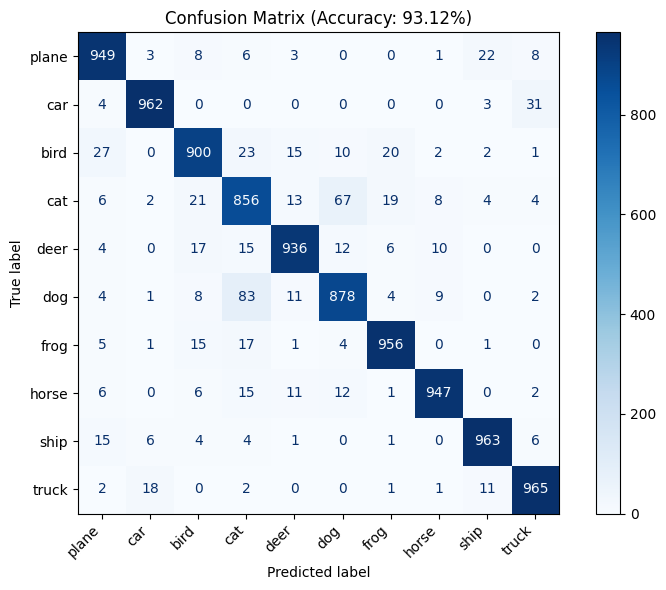

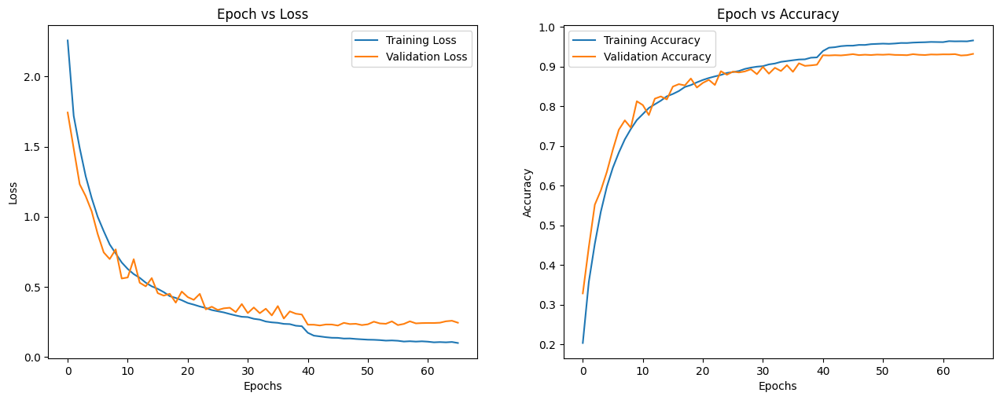

In [14]:
set_seed(seed=SEED)
ResNet18 = ResNet18(input_channels=3, num_classes=10).to(DEVICE)
trainable_params = sum(p.numel() for p in ResNet18.parameters() if p.requires_grad)
print("trainable parameters =", trainable_params)
                                   #    You may only modify the specified sections in this cell, if necessary # 
######################################################################################################################

train_loss, train_acc, val_loss, val_acc, best_state = train(
    model=ResNet18,
    device=DEVICE,
    train_loader=train_loader,
    validation_loader=validation_loader,
    epochs=120,                     # shorter than 180 but still strong
    patience=20,
    lr=0.10,                        # good for batch_size≈512; if unstable use 0.05
    early_stopping=True,
    scheduler_type='StepLR',
    scheduler_params={'step_size': 40, 'gamma': 0.2},  # LR drops at 40 & 80
    scheduler_enable=True,
    return_best=True
)
######################################################################################################################

ResNet18.load_state_dict(best_state)
test_acc = test(ResNet18, DEVICE, test_loader, classes=classes)
plot_loss_accuracy(train_loss , train_acc , val_loss, val_acc)
torch.save(best_state, 'resnet18.pth')
del ResNet18
del best_state
torch.cuda.empty_cache()

# Design your model.










### 🧠 Task: Design Your Convolution-Based Model

In this section, you must design your own convolution-based model. Your model must meet the following requirements:

- 🎯 Achieve **over 91% accuracy** on the test set.
- 🧮 Contain **fewer than 1 million learnable parameters**.
- 📉 Maintain a **validation loss below 0.3** for **at least 5 epochs** during training  and **for final model**.
- 🧱 The model should consist of:
  - A **convolutional feature extractor** for image feature extraction.
  - A **classification head** built using an **MLP (Multi-Layer Perceptron)**.
- 🖼️ Finally, the model should classify the input images from the **CIFAR-10 dataset**.

📌 You are allowed to use **data augmentation** techniques to improve performance. However, your model must achieve **at least 85% accuracy without data augmentation**, and then reach **over 90% accuracy with data augmentation**.

📌 you can ues learnabel pooling(like attention pooling)


In [15]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# --- helpers ---
class ConvBNAct(nn.Module):
    def __init__(self, in_ch, out_ch, k=3, s=1, p=1, act=nn.SiLU(inplace=True)):
        super().__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, kernel_size=k, stride=s, padding=p, bias=False)
        self.bn   = nn.BatchNorm2d(out_ch)
        self.act  = act
    def forward(self, x):
        return self.act(self.bn(self.conv(x)))

class SqueezeExcite(nn.Module):
    def __init__(self, ch, r=16):
        super().__init__()
        hidden = max(8, ch // r)
        self.avg = nn.AdaptiveAvgPool2d(1)
        self.fc  = nn.Sequential(
            nn.Conv2d(ch, hidden, 1, bias=True),
            nn.SiLU(inplace=True),
            nn.Conv2d(hidden, ch, 1, bias=True),
            nn.Sigmoid()
        )
    def forward(self, x):
        w = self.fc(self.avg(x))
        return x * w

class DropPath(nn.Module):
    """Stochastic depth (per-sample). Param-free regularizer."""
    def __init__(self, drop_prob=0.0):
        super().__init__()
        self.drop_prob = drop_prob
    def forward(self, x):
        if not self.training or self.drop_prob == 0.0:
            return x
        keep = 1 - self.drop_prob
        shape = (x.size(0),) + (1,) * (x.ndim - 1)
        rand  = x.new_empty(shape).bernoulli_(keep)
        return x * rand / keep

class ResidualBlock(nn.Module):
    def __init__(self, in_ch, out_ch, stride=1, drop_path=0.0):
        super().__init__()
        self.conv1 = ConvBNAct(in_ch, out_ch, k=3, s=stride, p=1)
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, 3, 1, 1, bias=False),
            nn.BatchNorm2d(out_ch)
        )
        self.se   = SqueezeExcite(out_ch, r=16)
        self.down = None
        if stride != 1 or in_ch != out_ch:
            self.down = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 1, stride=stride, bias=False),
                nn.BatchNorm2d(out_ch)
            )
        self.drop_path = DropPath(drop_path)
        self.act = nn.SiLU(inplace=True)

    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.se(out)
        if self.down is not None:
            identity = self.down(identity)
        out = self.drop_path(out) + identity
        return self.act(out)

class AttentionPool(nn.Module):
    """Learnable attention pooling over spatial dims (H×W) → vector (C)."""
    def __init__(self, channels, hidden=None):
        super().__init__()
        if hidden is None:
            hidden = max(8, channels // 8)
        self.attn = nn.Sequential(
            nn.Conv2d(channels, hidden, 1, bias=True),
            nn.SiLU(inplace=True),
            nn.Conv2d(hidden, 1, 1, bias=True)
        )
    def forward(self, x):              # x: (B,C,H,W)
        a = self.attn(x)               # (B,1,H,W)
        a = a.flatten(2)               # (B,1,HW)
        a = torch.softmax(a, dim=-1)   # (B,1,HW)
        xF = x.flatten(2)              # (B,C,HW)
        out = torch.bmm(xF, a.transpose(1,2)).squeeze(-1)  # (B,C)
        return out

# --- model ---
class CNN_MODEL_1(nn.Module):
    def __init__(self, num_classes=10, widths=(32, 64, 128), drop2d_p=0.10, head_p=0.30, drop_path_max=0.05):
        super().__init__()
        c1, c2, c3 = widths

        # feature extractor
        self.stem   = ConvBNAct(3, c1, k=3, s=1, p=1)
        # linearly scaled droppath across depth (5 blocks)
        dp = [i * drop_path_max / 4 for i in range(5)]
        self.block1 = ResidualBlock(c1, c1, stride=1, drop_path=dp[0])    # 32x32
        self.block2 = ResidualBlock(c1, c2, stride=2, drop_path=dp[1])    # 16x16
        self.block3 = ResidualBlock(c2, c2, stride=1, drop_path=dp[2])    # 16x16
        self.block4 = ResidualBlock(c2, c3, stride=2, drop_path=dp[3])    # 8x8
        self.block5 = ResidualBlock(c3, c3, stride=1, drop_path=dp[4])    # 8x8

        # tiny spatial dropout (regularization, param-free)
        self.drop2d = nn.Dropout2d(p=drop2d_p)

        # learnable pooling
        self.pool = AttentionPool(c3, hidden=16)

        # MLP head
        self.classifier = nn.Sequential(
            nn.Linear(c3, 256),
            nn.SiLU(inplace=True),
            nn.Dropout(head_p),
            nn.Linear(256, num_classes)
        )

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1.0)
                nn.init.constant_(m.bias, 0.0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0.0)

    def forward(self, x):
        x = self.stem(x)
        x = self.drop2d(self.block1(x))
        x = self.drop2d(self.block2(x))
        x = self.drop2d(self.block3(x))
        x = self.drop2d(self.block4(x))
        x = self.drop2d(self.block5(x))
        x = self.pool(x)
        x = self.classifier(x)
        return x


# train & evalovation

Random seed 1404 has been set.
trainable parameters = 721555


Training: 100%|██████████| 120/120 [54:02<00:00, 27.02s/epoch, train_loss=0.4452, val_loss=0.3018, train_acc=84.5%, val_acc=89.5%, no_improve=4, lr=0.0002] 


Returning the best model state (lowest validation loss).
epochs with val_loss < 0.30: 0
longest consecutive streak < 0.30: 0 epochs


Testing: 100%|██████████| 40/40 [00:01<00:00, 28.69batch/s]


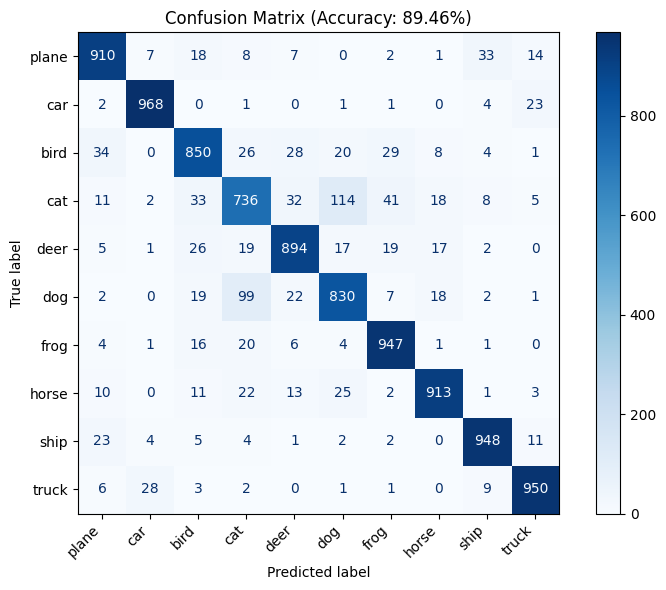

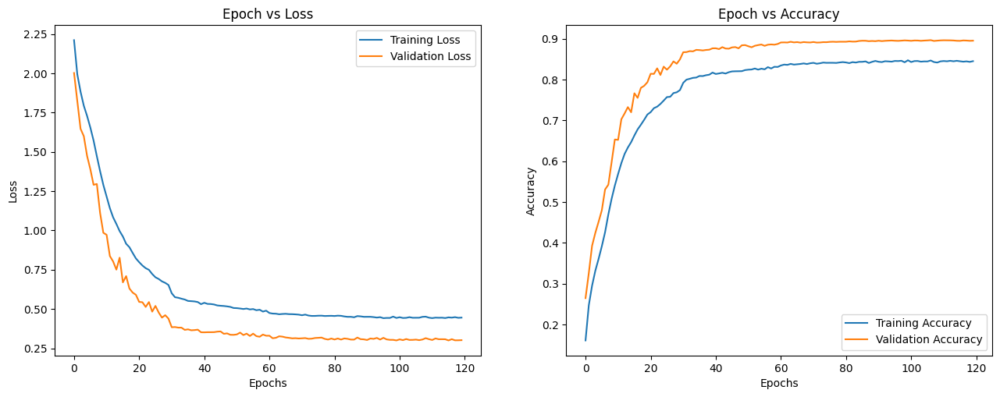

In [16]:
set_seed(seed=SEED)
net = CNN_MODEL_1().to(DEVICE)
trainable_params = sum(p.numel() for p in net.parameters() if p.requires_grad)
print("trainable parameters =", trainable_params)

                        # You may only modify the specified sections in this cell, if necessary   # 

######################################################################################################################
train_loss, train_acc, val_loss, val_acc, best_state = train(
    model=net,
    device=DEVICE,
    train_loader=train_loader,
    validation_loader=validation_loader,
    epochs = 120 ,  #  you can change max = 300
    patience = 40, #  you can change max = 20 
    lr = 0.1 , #  you can change
    early_stopping = True, #  you can change
    scheduler_type='StepLR',
    scheduler_params={'step_size': 30, 'gamma': 0.2},  # drops at 40 & 80
    scheduler_enable=True,
    return_best = True #  you can change
)
######################################################################################################################
below_mask = [v < 0.30 for v in val_loss]
count_below = sum(below_mask)
streak = 0
best_streak = 0
for ok in below_mask:
    if ok:
        streak += 1
        best_streak = max(best_streak, streak)
    else:
        streak = 0

print(f"epochs with val_loss < 0.30: {count_below}")
print(f"longest consecutive streak < 0.30: {best_streak} epochs")

net.load_state_dict(best_state)
test_acc = test(net, DEVICE, test_loader, classes=classes)
plot_loss_accuracy(train_loss , train_acc , val_loss, val_acc)
torch.save(best_state, 'net.pth')
del net
del best_state
torch.cuda.empty_cache()

In [17]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
clear_gpu_memory()

### Other applications of neural networks


Please use your model’s feature extraction component to extract features from both the training and test datasets, then apply a different classification method to the test data based on the training data’s features, and report the accuracy.



In [18]:
# TO DO


from torch.utils.data import DataLoader

train_noaug, _, test_noaug = get_cifar10_dataset(
    augmentation_fn=get_augmentation_transforms,
    augment=False,        
    download=False,
    seed=SEED
)

feat_train_loader = DataLoader(train_noaug, batch_size=512, shuffle=False, num_workers=2, pin_memory=True)
feat_test_loader  = DataLoader(test_noaug,  batch_size=512, shuffle=False, num_workers=2, pin_memory=True)


model = CNN_MODEL_1().to(DEVICE)   
state_dict = torch.load("net.pth", map_location=DEVICE) 
model.load_state_dict(state_dict)
model.eval()


import torch
import numpy as np

@torch.no_grad()
def extract_features(model, loader, device):
    feats, labels = [], []
    for x, y in loader:
        x = x.to(device)

        if hasattr(model, "pool") and hasattr(model, "classifier"):   # your CNN_MODEL_1 path
            z = model.stem(x)
            z = model.block1(z); z = model.block2(z); z = model.block3(z); z = model.block4(z); z = model.block5(z)
            z = model.pool(z)                  # (B, 128)
        else:
            # ResNet-18 (CIFAR stem)
            z = model.relu(model.bn1(model.conv1(x)))
            z = model.layer1(z); z = model.layer2(z); z = model.layer3(z); z = model.layer4(z)
            z = model.avgpool(z)
            z = torch.flatten(z, 1)            # (B, 512)

        feats.append(z.cpu())
        labels.append(y)

    feats = torch.cat(feats, 0).numpy()
    labels = torch.cat(labels, 0).numpy()
    return feats, labels

X_tr, y_tr = extract_features(model, feat_train_loader, DEVICE)
X_te, y_te = extract_features(model, feat_test_loader,  DEVICE)

print("Feature shapes:", X_tr.shape, X_te.shape)


from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score, classification_report


clf = make_pipeline(
    StandardScaler(),                                    
    LogisticRegression(max_iter=2000, solver="lbfgs",    
                       multi_class="multinomial", C=2.0, n_jobs=-1)
)
clf.fit(X_tr, y_tr)
pred = clf.predict(X_te)
acc = accuracy_score(y_te, pred)
print(f"[Other application] Logistic Regression on frozen CNN features — Test Acc: {acc*100:.2f}%")



Feature shapes: (50000, 128) (10000, 128)
[Other application] Logistic Regression on frozen CNN features — Test Acc: 89.64%


## CIFAR100

In this section, we aim to test the trained model on a different dataset. For this purpose, we will use the CIFAR100 dataset, which is similar to CIFAR10 but has different types and numbers of classes. 

100%|██████████| 169M/169M [00:02<00:00, 77.3MB/s] 


=== Total sample counts per class ===
Class 'apple' (label 0): 500 samples
Class 'aquarium_fish' (label 1): 500 samples
Class 'baby' (label 2): 500 samples
Class 'bear' (label 3): 500 samples
Class 'beaver' (label 4): 500 samples
Class 'bed' (label 5): 500 samples
Class 'bee' (label 6): 500 samples
Class 'beetle' (label 7): 500 samples
Class 'bicycle' (label 8): 500 samples
Class 'bottle' (label 9): 500 samples
Class 'bowl' (label 10): 500 samples
Class 'boy' (label 11): 500 samples
Class 'bridge' (label 12): 500 samples
Class 'bus' (label 13): 500 samples
Class 'butterfly' (label 14): 500 samples
Class 'camel' (label 15): 500 samples
Class 'can' (label 16): 500 samples
Class 'castle' (label 17): 500 samples
Class 'caterpillar' (label 18): 500 samples
Class 'cattle' (label 19): 500 samples
Class 'chair' (label 20): 500 samples
Class 'chimpanzee' (label 21): 500 samples
Class 'clock' (label 22): 500 samples
Class 'cloud' (label 23): 500 samples
Class 'cockroach' (label 24): 500 samples


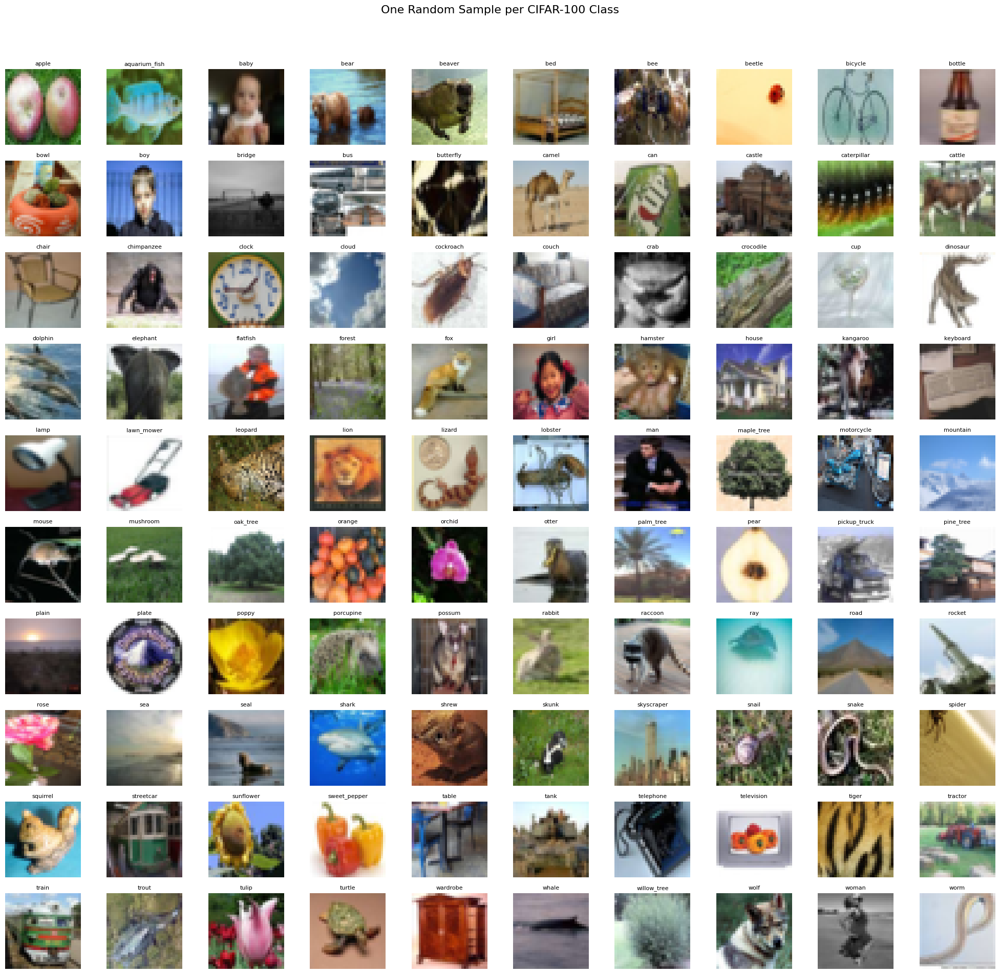

In [19]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #

train_dataset = torchvision.datasets.CIFAR100(
    root='./data',
    train=True,
    download=True,
    transform=transforms.ToTensor()
)

classes = train_dataset.classes

total_counts = Counter(train_dataset.targets)

print("=== Total sample counts per class ===")
for idx, cls_name in enumerate(classes):
    print(f"Class '{cls_name}' (label {idx}): {total_counts[idx]} samples")

sampled_images = []
for cls in range(100):
    indices = [i for i, label in enumerate(train_dataset.targets) if label == cls]
    random_idx = random.choice(indices)
    image, label = train_dataset[random_idx]
    sampled_images.append(image)

fig, axes = plt.subplots(10, 10, figsize=(20, 20))
fig.suptitle("One Random Sample per CIFAR-100 Class", fontsize=16)

for i in range(100):
    ax = axes.flat[i]
    ax.imshow(sampled_images[i].permute(1, 2, 0).numpy())
    ax.set_title(classes[i], fontsize=8)
    ax.axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [20]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
def get_cifar100_dataset(
    augmentation_fn,
    augment = False,
    download = False,
    seed = 0
):
    """
    Helper function to get CIFAR-100 dataset

    Args:
      augment: boolean
        If True, apply augmentation to training data
      augmentation_fn: callable
        Function that returns a list of augmentation transforms
      download: boolean
        If True, download dataset
      seed: int
        Set seed for reproducibility [default: 0]

    Returns:
      train_data: torch.dataset
        Training data
      validation_data: torch.dataset
        Validation data
      test_data: torch.dataset
        Test data
    """
    basic_transforms = [
        transforms.ToTensor(),
        transforms.Normalize((0.48, 0.48, 0.48), (0.20, 0.20, 0.20))
    ]
    
    if augment:
        aug_transforms = augmentation_fn()
        train_transform = transforms.Compose(aug_transforms + basic_transforms)
    else:
        train_transform = transforms.Compose(basic_transforms)
    
    test_transform = transforms.Compose(basic_transforms)

    train_data = datasets.CIFAR100(root='.', download=download, train=True, transform=train_transform)
    test_data = datasets.CIFAR100(root='.', download=download, train=False, transform=test_transform)
  
    validation_data =  test_data

    return train_data, validation_data, test_data


def get_data_loaders(
    train_dataset,
    validation_dataset,
    test_dataset,
    seed,
):
    """
    Helper function to fetch dataloaders

    Args:
      train_dataset: torch.dataset
        Training data
      validation_dataset: torch.dataset
        Validation data
      test_dataset: torch.dataset
        Test data
      seed: int
        Set seed for reproducibility
      batch_size: int
        Batch size [default: 64]

    Returns:
      train_loader: DataLoader
      validation_loader: DataLoader
      test_loader: DataLoader
    """
    g_seed = torch.Generator()
    g_seed.manual_seed(seed)
    
    train_loader = DataLoader(
        train_dataset, batch_size = 512, shuffle = True,
        num_workers=2, worker_init_fn=seed_worker, generator=g_seed
    )
    
    validation_loader = DataLoader(
        validation_dataset, batch_size = 256, shuffle = True,
        num_workers=2, worker_init_fn=seed_worker, generator=g_seed
    )
    
    test_loader = DataLoader(
        test_dataset, batch_size = 256, shuffle = True,
        num_workers=2, worker_init_fn=seed_worker, generator=g_seed
    )
    
    return train_loader, validation_loader, test_loader

## ADD Agmention if you need 

In [21]:
import torchvision.transforms as transforms

def get_augmentation_transforms():
    """
    Placeholder for Augmentation Transforms for CIFAR-100

    Returns:
      augmentation_transforms: list
        List of augmentation transforms to be filled by user
    """

    # List of augmentation transforms
    augmentation_transforms = [
        transforms.RandomCrop(32, padding=4, padding_mode="reflect"),  # Random crop with padding
        transforms.RandomHorizontalFlip(p=0.5),  # Horizontal flip with 50% chance
        transforms.RandomRotation(10),  # Random rotation within 10 degrees
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.02),  # Color jitter
        transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1)),  # Affine transform with random rotation, translation, and scaling
    ]
    
    return augmentation_transforms  # Return as list (not Compose)


# Assuming set_seed function and get_cifar100_dataset are defined correctly
set_seed(seed=SEED)

# Calling the function to get the dataset with transformations
train_data, validation_data, test_data = get_cifar100_dataset(
    augmentation_fn=get_augmentation_transforms,
    augment=True,
    download=True,
    seed=SEED
)


Random seed 1404 has been set.


100%|██████████| 169M/169M [00:02<00:00, 79.4MB/s] 


In [22]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫         ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #

set_seed(seed=SEED)
train_loader, validation_loader, test_loader = get_data_loaders(
    train_data,
    validation_data,
    test_data,
    seed=SEED
)

Random seed 1404 has been set.


### Modify ResNet-18

Change the final linear layer of the ResNet-18 model  according to the new number of classes And freeze all other layers.


You must achieve over 44% accuracy on the test data.


In [23]:
import torch
import torch.nn as nn
from torchvision import models

set_seed(seed=SEED)

# Load pretrained ResNet-18
ResNet18 = models.resnet18(pretrained=True)

# Freeze all layers initially
for param in ResNet18.parameters():
    param.requires_grad = False

# Unfreeze the last few layers for fine-tuning
# Unfreeze layer4 (last block of the model)
for param in ResNet18.layer4.parameters():
    param.requires_grad = True

# Unfreeze layer3
for param in ResNet18.layer3.parameters():
    param.requires_grad = True

# Unfreeze layer2
for param in ResNet18.layer2.parameters():
    param.requires_grad = True

# Unfreeze layer1
for param in ResNet18.layer1.parameters():
    param.requires_grad = True

# Modify the final fully connected layer to match the number of classes (CIFAR-100 has 100 classes)
ResNet18.fc = nn.Linear(ResNet18.fc.in_features, 100)


Random seed 1404 has been set.


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 174MB/s] 


Random seed 1404 has been set.


Training: 100%|██████████| 50/50 [26:07<00:00, 31.35s/epoch, train_loss=2.3377, val_loss=2.2056, train_acc=39.1%, val_acc=41.7%, no_improve=12, lr=0.0000]


Returning the best model state (lowest validation loss).


Testing: 100%|██████████| 40/40 [00:01<00:00, 29.49batch/s]


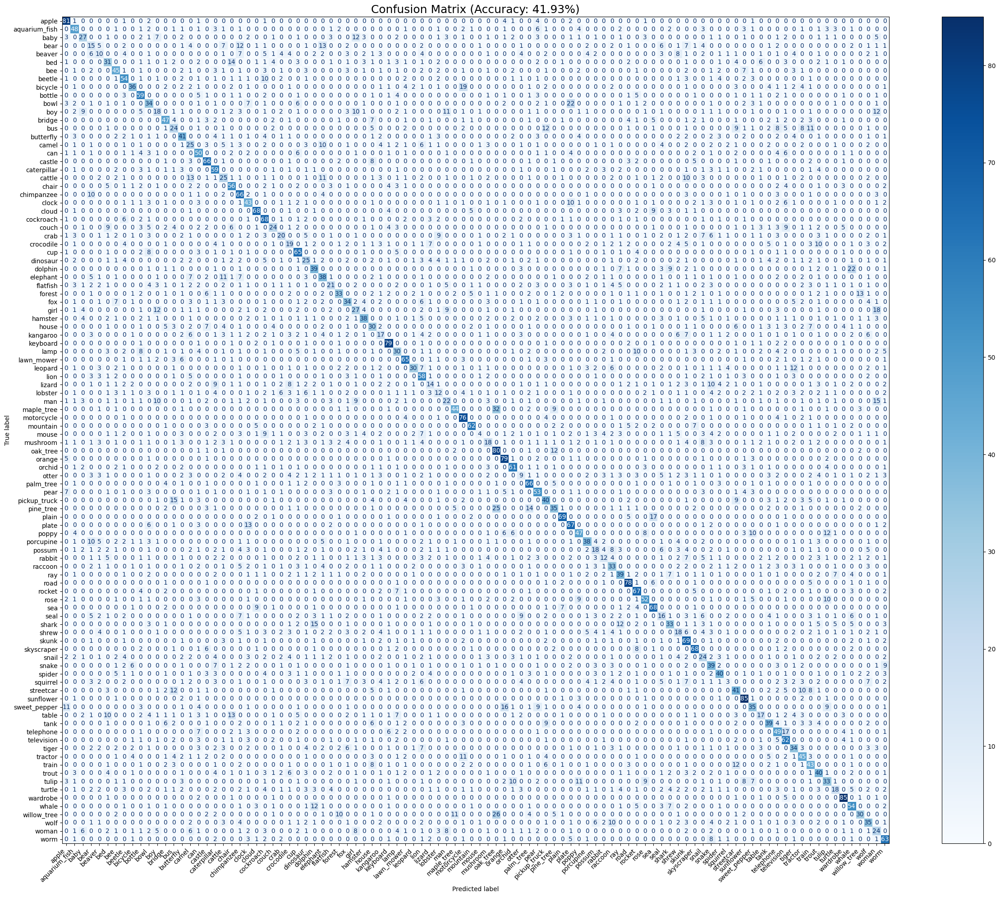

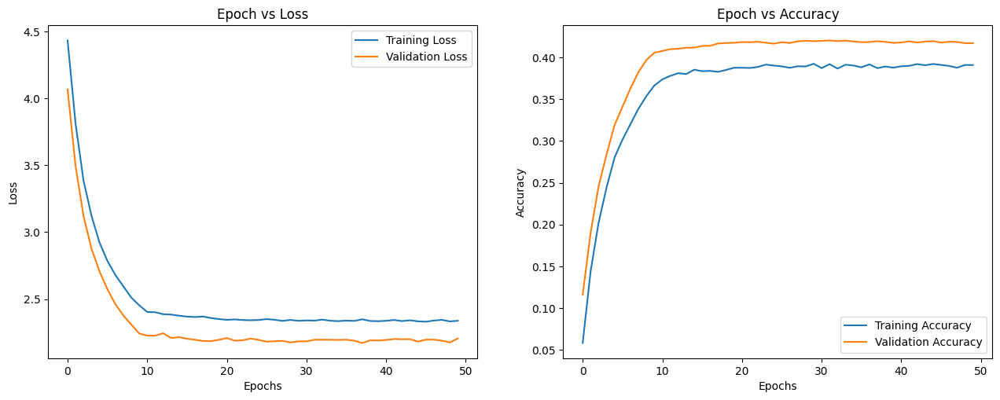

In [24]:
set_seed(seed=SEED)

#    You may only modify the specified sections in this cell, if necessary   

######################################################################################################################
# to do 
ResNet18_p = ResNet18.to(DEVICE)

# Choose the scheduler type and parameters
scheduler_type = 'StepLR'  # Set this to your desired scheduler type
scheduler_params = {
    'step_size': 10,  # Change LR every 10 epochs
    'gamma': 0.1      # LR decay factor
}
scheduler_enable = True  # Enable the scheduler

train_loss, train_acc, val_loss, val_acc, best_state = train(
    model=ResNet18_p ,
    device=DEVICE,
    train_loader=train_loader,
    validation_loader=validation_loader,
    epochs=50,  # You can change max = 200
    patience=15,  # You can change max = 20 
    lr=0.001,  # Learning rate
    early_stopping=True,  # You can change
    scheduler_type=scheduler_type,  # Set the scheduler type
    scheduler_params=scheduler_params,  # Set the scheduler parameters
    scheduler_enable=scheduler_enable,  # Enable the scheduler
    return_best=True  # You can change
)
######################################################################################################################

ResNet18_p.load_state_dict(best_state)
test_acc = test(ResNet18_p, DEVICE, test_loader, classes=classes)
plot_loss_accuracy(train_loss, train_acc, val_loss, val_acc)
torch.save(best_state, 'ResNet18_p.pth')
del ResNet18_p
del best_state
torch.cuda.empty_cache()


# Modify your model 

Change the classification layer of the your model  according to the new number of classes And freeze all other layers.

You must achieve over 44% accuracy on the test data.

In [25]:
import torch
import torch.nn as nn
from torchvision import models

set_seed(seed=SEED)

# Load pretrained ResNet-18
ResNet18 = models.resnet18(pretrained=True)

# Freeze all layers initially
for param in ResNet18.parameters():
    param.requires_grad = False

# Unfreeze the last few layers for fine-tuning
for param in ResNet18.layer4.parameters():
    param.requires_grad = True

for param in ResNet18.layer3.parameters():
    param.requires_grad = True

for param in ResNet18.layer2.parameters():
    param.requires_grad = True

for param in ResNet18.layer1.parameters():
    param.requires_grad = True

ResNet18.fc = ResNet18.fc = nn.Linear(ResNet18.fc.in_features, 100)



Random seed 1404 has been set.


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
set_seed(seed=SEED)

                    #    You may only modify the specified sections in this cell, if necessary   # 
######################################################################################################################
# to do 
ResNet18 = ResNet18.to(DEVICE)

net1 =  ResNet18

scheduler_type = 'StepLR'  # Set this to your desired scheduler type
scheduler_params = {
    'step_size': 10,  # Change LR every 10 epochs
    'gamma': 0.1      # LR decay factor
}
scheduler_enable = True  # Enable the scheduler

train_loss, train_acc, val_loss, val_acc, best_state = train(
    model=net1 ,
    device=DEVICE,
    train_loader=train_loader,
    validation_loader=validation_loader,
    epochs=50,  # You can change max = 200
    patience=15,  # You can change max = 20 
    lr=0.001,  # Learning rate
    early_stopping=True,  # You can change
    scheduler_type=scheduler_type,  # Set the scheduler type
    scheduler_params=scheduler_params,  # Set the scheduler parameters
    scheduler_enable=scheduler_enable,  # Enable the scheduler
    return_best=True  # You can change
)

######################################################################################################################

net1.load_state_dict(best_state)
test_acc = test(net1, DEVICE, test_loader, classes=classes)
plot_loss_accuracy(train_loss , train_acc , val_loss, val_acc)
torch.save(best_state, 'net1.pth')
del net1
del best_state
torch.cuda.empty_cache()


In [27]:
                                    # ╔════════════════════════════════════════════════════════╗ #
                                    # ║           🚫  DO NOT CHANGE THIS CELL!  🚫            ║ #
                                    # ╚════════════════════════════════════════════════════════╝ #
# Clear memory before new model
clear_gpu_memory()


### 🧠 Task: Redesign Your Convolution-Based Model for complex dataset(100 calsses)

In this section, you must design your own convolution-based model. Your model must meet the following requirements:

- 🎯 Achieve **over 67% accuracy** on the test set.
- 🧮 Contain **fewer than 3 million learnable parameters**.
- 📉 Maintain a **validation loss below 1.2** for **at least 5 epochs** during training and for **final model** .
- 🧱 The model should consist of:
  - A **convolutional feature extractor** for image feature extraction.
  - A **classification head** built using an **MLP (Multi-Layer Perceptron)**.
- 🖼️ Finally, the model should classify the input images from the **CIFAR-100 dataset**.

📌 You are allowed to use **data augmentation** techniques to improve performance. However, your model must achieve **at least 45% accuracy without data augmentation**, and then reach **over 67% accuracy with data augmentation**.

📌 you can ues learnabel pooling(like attention pooling)


In [21]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms

class CNN_MODEL(nn.Module):
    def __init__(self, num_classes=100):
        super(CNN_MODEL, self).__init__()

        # Convolutional layers (Feature extractor)
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # 3 input channels, 32 filters
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)

        # Batch Normalization
        self.bn1 = nn.BatchNorm2d(32)
        self.bn2 = nn.BatchNorm2d(64)
        self.bn3 = nn.BatchNorm2d(128)

        # Max-pooling layer
        self.pool = nn.MaxPool2d(2, 2)

        # Fully connected layers (MLP head)
        self.fc1 = nn.Linear(128 * 4 * 4, 512)  # Flatten the output of last conv layer
        self.fc2 = nn.Linear(512, num_classes)  # CIFAR-100 has 100 classes
        
        # Dropout for regularization
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        # Convolutional layers with batch normalization and ReLU
        x = self.pool(F.relu(self.bn1(self.conv1(x))))  # Conv1 + BatchNorm + ReLU + Pooling
        x = self.pool(F.relu(self.bn2(self.conv2(x))))  # Conv2 + BatchNorm + ReLU + Pooling
        x = self.pool(F.relu(self.bn3(self.conv3(x))))  # Conv3 + BatchNorm + ReLU + Pooling

        # Flatten the output from the conv layers to feed into the fully connected layers
        x = x.view(-1, 128 * 4 * 4)

        # Fully connected layers (MLP)
        x = F.relu(self.fc1(x))  # First FC layer with ReLU activation
        x = self.dropout(x)  # Apply dropout
        x = self.fc2(x)  # Output layer
        
        return x

# Instantiate the model
model = CNN_MODEL(num_classes=100)



In [ ]:
set_seed(seed=SEED)
                    #    You may only modify the specified sections in this cell, if necessary   # 
######################################################################################################################
# to do 
net2 = CNN_MODEL().to(DEVICE)
trainable_params = sum(p.numel() for p in net2.parameters() if p.requires_grad)
print("trainable parameters =", trainable_params)
scheduler_type = 'StepLR'  # Set this to your desired scheduler type
scheduler_params = {
    'step_size': 10,  # Change LR every 10 epochs
    'gamma': 0.1      # LR decay factor
}
scheduler_enable = True  # Enable the scheduler

train_loss, train_acc, val_loss, val_acc, best_state = train(
    model=net2,
    device=DEVICE,
    train_loader=train_loader,
    validation_loader=validation_loader,
    epochs=50,  # You can change max = 200
    patience=15,  # You can change max = 20 
    lr=0.001,  # Learning rate
    early_stopping=True,  # You can change
    scheduler_type=scheduler_type,  # Set the scheduler type
    scheduler_params=scheduler_params,  # Set the scheduler parameters
    scheduler_enable=scheduler_enable,  # Enable the scheduler
    return_best=True  # You can change
)
######################################################################################################################
net2.load_state_dict(best_state)
test_acc = test(net2, DEVICE, test_loader, classes=classes)
plot_loss_accuracy(train_loss , train_acc , val_loss, val_acc)
torch.save(best_state , 'net2.pth')
del net2
del best_state
torch.cuda.empty_cache()

# bonus (100 points)

All tasks in this section must be carried out for each of your two models and for both datasets, and you should compare them; both should achieve similar results.

## Visualize incorrectly predicted samples from testset  for both model and campare (5 points )

Visualize *24* random images from testset that are incorrectly predicted by the model. Note that if you used normalization in the transform function for loading the data, you will need to unnormalize the images before displaying them.

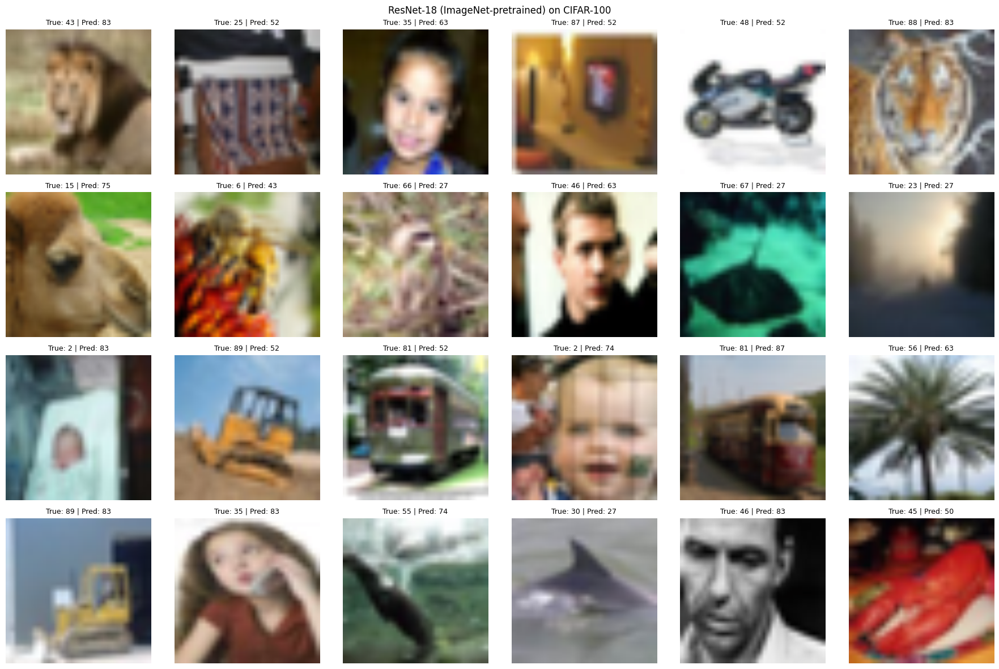

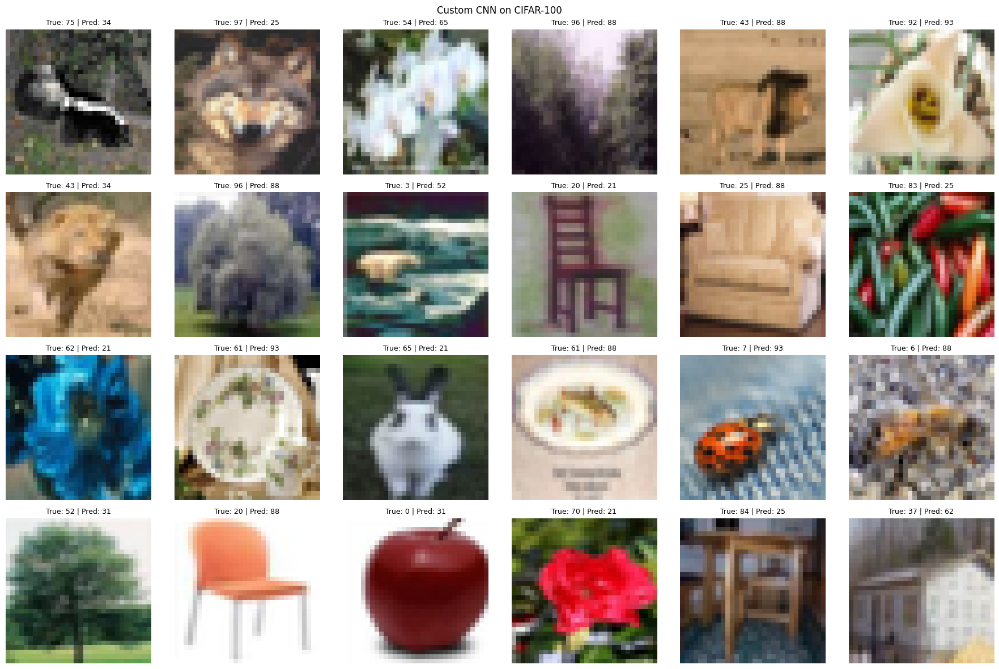

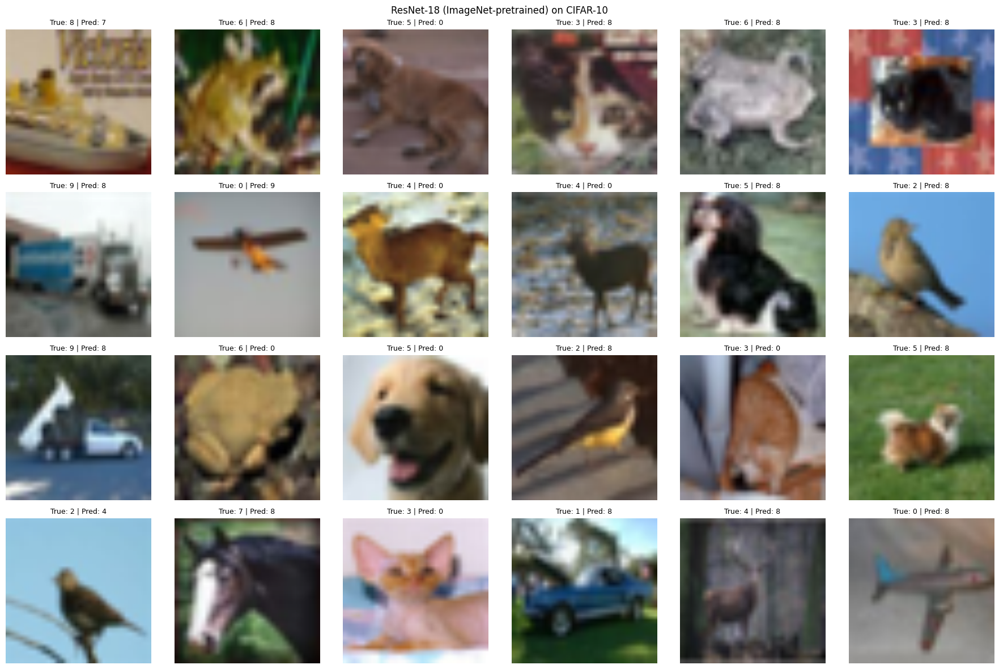

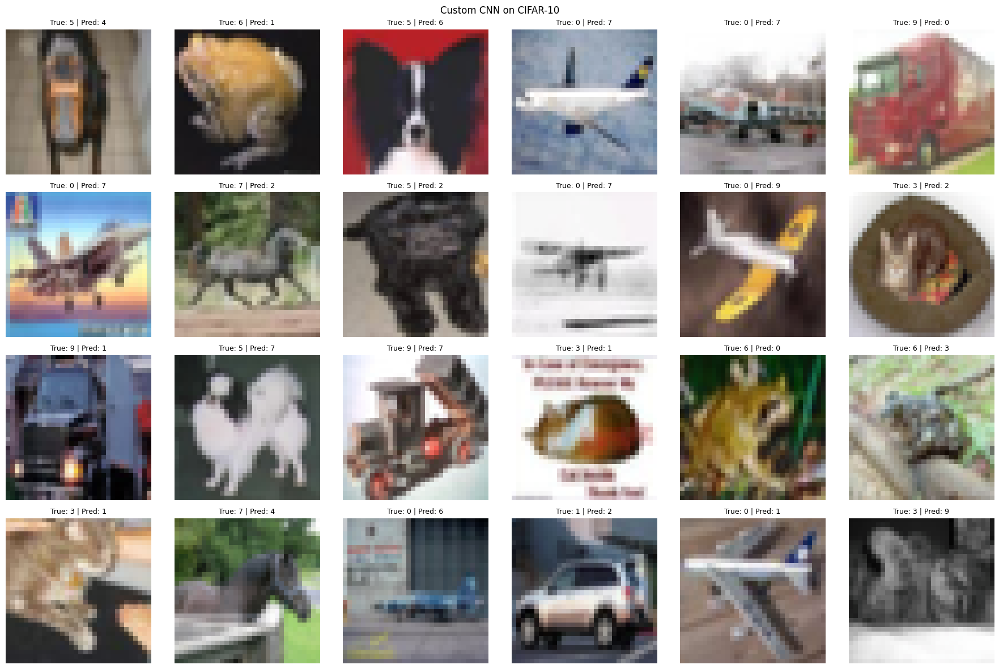

In [25]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
from math import ceil
from torchvision import datasets, transforms
from torchvision.models import resnet18, ResNet18_Weights
from torch.utils.data import DataLoader

# ----------------------------
# Device
# ----------------------------
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ----------------------------
# Normalization constants
# ----------------------------
# CIFAR-100
mean_cifar100 = (0.5071, 0.4867, 0.4408)
std_cifar100  = (0.2675, 0.2565, 0.2761)
# CIFAR-10
mean_cifar10 = (0.4914, 0.4822, 0.4465)
std_cifar10  = (0.2470, 0.2435, 0.2616)
# ImageNet (for pretrained ResNet)
mean_imagenet = (0.485, 0.456, 0.406)
std_imagenet  = (0.229, 0.224, 0.225)

# ----------------------------
# Datasets & Dataloaders
#   - ResNet loaders: resize to 224 and use ImageNet stats
#   - CNN loaders: keep 32×32 and use CIFAR stats
# ----------------------------
def get_test_loader_cifar100_for_resnet(batch_size=256, root='./data'):
    tfm = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean_imagenet, std_imagenet),
    ])
    ds = datasets.CIFAR100(root=root, train=False, transform=tfm, download=True)
    return DataLoader(ds, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

def get_test_loader_cifar10_for_resnet(batch_size=256, root='./data'):
    tfm = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean_imagenet, std_imagenet),
    ])
    ds = datasets.CIFAR10(root=root, train=False, transform=tfm, download=True)
    return DataLoader(ds, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

def get_test_loader_cifar100_for_cnn(batch_size=256, root='./data'):
    tfm = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean_cifar100, std_cifar100),
    ])
    ds = datasets.CIFAR100(root=root, train=False, transform=tfm, download=True)
    return DataLoader(ds, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

def get_test_loader_cifar10_for_cnn(batch_size=256, root='./data'):
    tfm = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean_cifar10, std_cifar10),
    ])
    ds = datasets.CIFAR10(root=root, train=False, transform=tfm, download=True)
    return DataLoader(ds, batch_size=batch_size, shuffle=False, num_workers=2, pin_memory=True)

test_loader_cifar100_resnet = get_test_loader_cifar100_for_resnet()
test_loader_cifar10_resnet  = get_test_loader_cifar10_for_resnet()
test_loader_cifar100_cnn    = get_test_loader_cifar100_for_cnn()
test_loader_cifar10_cnn     = get_test_loader_cifar10_for_cnn()

# ----------------------------
# Unnormalize helper (for showing images)
# ----------------------------
def unnormalize(imgs, mean, std):
    # imgs: (N,C,H,W)
    mean = torch.tensor(mean, device=imgs.device).view(1, -1, 1, 1)
    std  = torch.tensor(std, device=imgs.device).view(1, -1, 1, 1)
    return imgs * std + mean

# ----------------------------
# Visualization helper
# ----------------------------
def visualize_incorrect_predictions(model, test_loader, device, mean, std, num_images=24, title=None):
    model.eval()
    incorrect_images, incorrect_labels, incorrect_preds = [], [], []

    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            pred = output.argmax(dim=1)
            mask_incorrect = (pred != target)
            if mask_incorrect.any():
                incorrect_images.append(data[mask_incorrect])
                incorrect_labels.append(target[mask_incorrect])
                incorrect_preds.append(pred[mask_incorrect])

    if len(incorrect_images) == 0:
        print("No incorrect predictions to display.")
        return

    incorrect_images = torch.cat(incorrect_images, dim=0)
    incorrect_labels = torch.cat(incorrect_labels, dim=0)
    incorrect_preds  = torch.cat(incorrect_preds,  dim=0)

    n = incorrect_images.size(0)
    k = min(num_images, n)
    indices = torch.randperm(n)[:k]
    imgs = incorrect_images[indices]
    labels = incorrect_labels[indices]
    preds = incorrect_preds[indices]

    # Unnormalize for display
    imgs = unnormalize(imgs, mean, std).clamp(0, 1)  # clamp to [0,1] for safety

    cols = min(6, k)
    rows = ceil(k / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows))
    axes = np.atleast_1d(axes).ravel()

    for i in range(k):
        img = imgs[i].detach().cpu().permute(1, 2, 0).numpy()
        axes[i].imshow(img)
        axes[i].set_title(f"True: {labels[i].item()} | Pred: {preds[i].item()}", fontsize=9)
        axes[i].axis('off')

    for j in range(k, len(axes)):
        axes[j].axis('off')

    if title is not None:
        fig.suptitle(title, fontsize=12)
    plt.tight_layout()
    plt.show()

# ----------------------------
# Models
# ----------------------------
# ResNet-18 with weights API (no deprecation warning)
# Create one head for CIFAR-100 and one for CIFAR-10
model1_100 = resnet18(weights=ResNet18_Weights.DEFAULT)
model1_100.fc = nn.Linear(model1_100.fc.in_features, 100)
model1_100.to(DEVICE)

model1_10 = resnet18(weights=ResNet18_Weights.DEFAULT)
model1_10.fc = nn.Linear(model1_10.fc.in_features, 10)
model1_10.to(DEVICE)

# Your custom CNN (CIFAR-100 head); you can clone for CIFAR-10 if desired
class CNN_MODEL(nn.Module):
    def __init__(self, num_classes=100):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.pool  = nn.MaxPool2d(2, 2)
        self.fc1   = nn.Linear(64 * 8 * 8, 512)
        self.fc2   = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))  # 32 -> 16
        x = self.pool(F.relu(self.conv2(x)))  # 16 -> 8
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        return self.fc2(x)

model2_100 = CNN_MODEL(num_classes=100).to(DEVICE)
model2_10  = CNN_MODEL(num_classes=10).to(DEVICE)

# ----------------------------
# Run visualizations
# ----------------------------
# CIFAR-100
visualize_incorrect_predictions(
    model1_100, test_loader_cifar100_resnet, DEVICE, mean_imagenet, std_imagenet,
    num_images=24, title="ResNet-18 (ImageNet-pretrained) on CIFAR-100"
)
visualize_incorrect_predictions(
    model2_100, test_loader_cifar100_cnn, DEVICE, mean_cifar100, std_cifar100,
    num_images=24, title="Custom CNN on CIFAR-100"
)

# CIFAR-10
visualize_incorrect_predictions(
    model1_10, test_loader_cifar10_resnet, DEVICE, mean_imagenet, std_imagenet,
    num_images=24, title="ResNet-18 (ImageNet-pretrained) on CIFAR-10"
)
visualize_incorrect_predictions(
    model2_10, test_loader_cifar10_cnn, DEVICE, mean_cifar10, std_cifar10,
    num_images=24, title="Custom CNN on CIFAR-10"
)


### Calculate the feature space for all training samples (10 points)

You have trained and evaluated your model. Now, for each sample in the trainset, calculate it's "feature space" discussed in the model section. The result of this section should be a tensor of size `(50000, N)` saved in a variable (for later usage)

- **Hint 1:** define a tensor with dimension `(50000, N)` where *50000* is the size of the trainset and *N* is the dimension of the feature space for cifar10 datset


In [26]:
# ============================
# CIFAR-10 train feature space
# ============================
import torch
import torch.nn as nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# --- Normalization (use the SAME stats used at train/eval) ---
mean_cifar10 = (0.4914, 0.4822, 0.4465)
std_cifar10  = (0.2470, 0.2435, 0.2616)
mean_imagenet = (0.485, 0.456, 0.406)
std_imagenet  = (0.229, 0.224, 0.225)

# --- Build CIFAR-10 train loaders for each model type ---
# ResNet-18 usually expects 224×224 + ImageNet stats
train_loader_cifar10_resnet = DataLoader(
    datasets.CIFAR10(
        root="./data",
        train=True,
        download=True,
        transform=transforms.Compose([
            transforms.Resize(224),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean_imagenet, std_imagenet),
        ])
    ),
    batch_size=256, shuffle=False, num_workers=2, pin_memory=True
)

# Custom CNN expects 32×32 + CIFAR-10 stats
train_loader_cifar10_cnn = DataLoader(
    datasets.CIFAR10(
        root="./data",
        train=True,
        download=True,
        transform=transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean_cifar10, std_cifar10),
        ])
    ),
    batch_size=256, shuffle=False, num_workers=2, pin_memory=True
)

def extract_features_penultimate(model: nn.Module, loader: DataLoader, device: torch.device):
    """
    Extracts the input to the LAST nn.Linear layer for every sample in `loader.dataset`.
    Returns:
      features: (N_samples, feature_dim) float32 CPU tensor
      labels:   (N_samples,) long CPU tensor
    """
    net = model.module if isinstance(model, nn.DataParallel) else model

    # Find the last Linear layer (classifier)
    last_linear = None
    for m in net.modules():
        if isinstance(m, nn.Linear):
            last_linear = m
    assert last_linear is not None, "No nn.Linear layer found to hook."

    feature_dim = last_linear.in_features
    n_samples = len(loader.dataset)
    features = torch.empty((n_samples, feature_dim), dtype=torch.float32)
    labels   = torch.empty((n_samples,), dtype=torch.long)

    # Hook to capture the INPUT to the last linear (penultimate feature)
    cache = {"feat": None}
    def hook(module, inputs, output):
        # inputs is a tuple; we want the tensor fed into the classifier
        cache["feat"] = inputs[0].detach().cpu()
    h = last_linear.register_forward_hook(hook)

    net.eval()
    ptr = 0
    with torch.no_grad():
        for images, targets in DataLoader(loader.dataset,  # ensures identical ordering
                                          batch_size=loader.batch_size,
                                          shuffle=False, num_workers=loader.num_workers,
                                          pin_memory=True):
            images = images.to(device, non_blocking=True)
            _ = net(images)  # triggers hook, fills cache["feat"]
            batch_feats = cache["feat"].view(images.size(0), -1)
            bs = images.size(0)
            features[ptr:ptr+bs] = batch_feats
            labels[ptr:ptr+bs] = targets
            ptr += bs

    h.remove()
    return features, labels

# ----- Choose which model to extract from -----
# If you created these earlier (from the previous cell):
#   model1_10 : ResNet-18 (10 classes)
#   model2_10 : your custom CNN (10 classes)
# If not, define them before running this block.

# Extract for ResNet-18 (ImageNet-pretrained head adapted to 10 classes)
features_train_resnet10, labels_train_resnet10 = extract_features_penultimate(
    model1_10, train_loader_cifar10_resnet, DEVICE
)
print("ResNet-18 CIFAR-10 features:", features_train_resnet10.shape)  # (50000, 512)

# Extract for your custom CNN
features_train_cnn10, labels_train_cnn10 = extract_features_penultimate(
    model2_10, train_loader_cifar10_cnn, DEVICE
)
print("Custom CNN CIFAR-10 features:", features_train_cnn10.shape)    # (50000, N_cnn)

# ---- Save the one you want for later usage in a single variable ----
# Set which set to use as your canonical feature space:
USE = "resnet"   # or "cnn"

if USE == "resnet":
    features_train = features_train_resnet10   # (50000, 512)
    train_labels   = labels_train_resnet10
else:
    features_train = features_train_cnn10      # (50000, N_cnn)
    train_labels   = labels_train_cnn10

print("features_train final shape:", features_train.shape)  # Expect (50000, N)


ResNet-18 CIFAR-10 features: torch.Size([50000, 512])
Custom CNN CIFAR-10 features: torch.Size([50000, 512])
features_train final shape: torch.Size([50000, 512])


##### K Nearest Neighbor in feature space (10 points)

You already have calculated the feature spaces for trainset ($S$) in the previous section

1. Get 10 random samples from testset which are correctly predicted by the model.
2. for each sample, calculate it's "feature space" ($X$)
3. for each sample, calculate it's *5* nearest neighbors in "feature space" in the trainset (by comparing $X$ to each row in $S$) and visualize them

**Note:** Your visualization should be something like the below picture

**Hint:** To find the nearest neighbors in the feature space, you can use any library of your choice.

Building test features/preds...


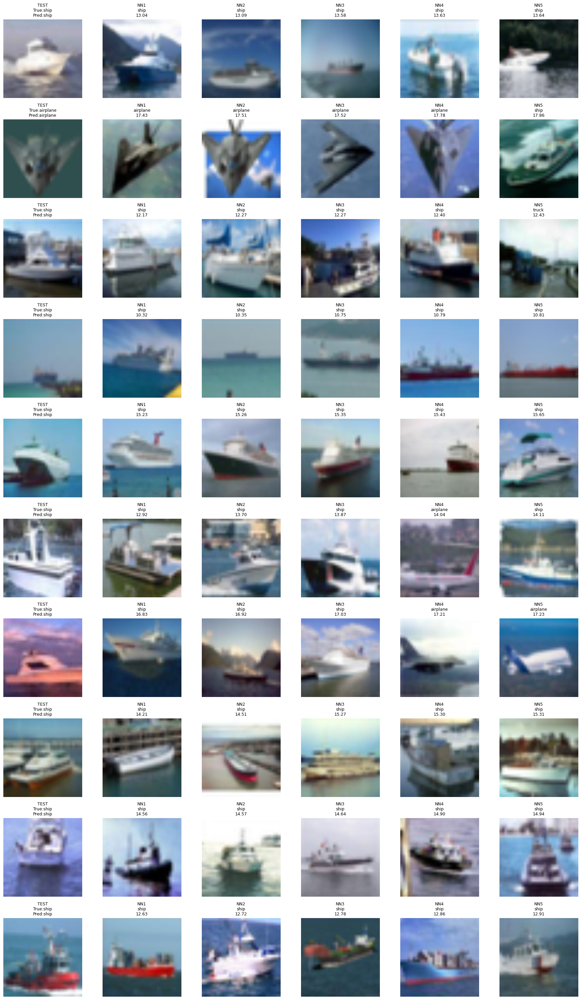

In [27]:
# TO DO


import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from math import ceil

# --- pick model, loaders, and stats based on your earlier `USE` flag ---
if USE == "resnet":
    model = model1_10
    test_loader = test_loader_cifar10_resnet
    train_dataset_vis = train_loader_cifar10_resnet.dataset
    test_dataset_vis  = test_loader_cifar10_resnet.dataset
    mean_vis = (0.485, 0.456, 0.406)  # ImageNet
    std_vis  = (0.229, 0.224, 0.225)
else:
    model = model2_10
    test_loader = test_loader_cifar10_cnn
    train_dataset_vis = train_loader_cifar10_cnn.dataset
    test_dataset_vis  = test_loader_cifar10_cnn.dataset
    mean_vis = (0.4914, 0.4822, 0.4465)  # CIFAR-10
    std_vis  = (0.2470, 0.2435, 0.2616)

device = DEVICE

# --- small helper: unnormalize for display ---
def unnormalize_(imgs, mean, std):
    mean = torch.tensor(mean, device=imgs.device).view(1, -1, 1, 1)
    std  = torch.tensor(std, device=imgs.device).view(1, -1, 1, 1)
    return (imgs * std + mean).clamp(0, 1)

# --- hook to capture penultimate features (input to the final Linear) ---
def capture_penultimate_features(model: nn.Module, images: torch.Tensor):
    net = model.module if isinstance(model, nn.DataParallel) else model
    last_linear = None
    for m in net.modules():
        if isinstance(m, nn.Linear):
            last_linear = m
    assert last_linear is not None, "No nn.Linear layer found."

    cache = {"feat": None}
    def hook(module, inputs, output):
        cache["feat"] = inputs[0].detach()  # (B, N)

    h = last_linear.register_forward_hook(hook)
    model.eval()
    with torch.no_grad():
        _ = net(images)
        feats = cache["feat"]
    h.remove()
    return feats  # (B, N)

# --- build ALL test features/preds first (ordered like dataset) ---
def build_test_features_and_preds(model, test_loader, device):
    net = model.module if isinstance(model, nn.DataParallel) else model
    # find feature dim once
    last_linear = None
    for m in net.modules():
        if isinstance(m, nn.Linear):
            last_linear = m
    feat_dim = last_linear.in_features
    N = len(test_loader.dataset)
    feats = torch.empty((N, feat_dim), dtype=torch.float32)
    labels = torch.empty((N,), dtype=torch.long)
    preds  = torch.empty((N,), dtype=torch.long)

    cache = {"feat": None}
    def hook(module, inputs, output):
        cache["feat"] = inputs[0].detach().cpu()

    h = last_linear.register_forward_hook(hook)
    net.eval()
    ptr = 0
    with torch.no_grad():
        for images, targets in test_loader:
            b = images.size(0)
            images = images.to(device, non_blocking=True)
            logits = net(images)
            feats[ptr:ptr+b] = cache["feat"].view(b, -1)
            labels[ptr:ptr+b] = targets
            preds[ptr:ptr+b]  = logits.argmax(1).cpu()
            ptr += b
    h.remove()
    return feats, labels, preds

print("Building test features/preds...")
test_features, test_labels, test_preds = build_test_features_and_preds(model, test_loader, device)

# --- choose 10 random CORRECT predictions ---
correct_idx = (test_preds == test_labels).nonzero(as_tuple=True)[0]
num_pick = min(10, correct_idx.numel())
if num_pick == 0:
    raise RuntimeError("No correct test predictions found. Train the model or switch USE to the trained one.")
perm = torch.randperm(correct_idx.numel())[:num_pick]
picked_idx = correct_idx[perm]  # (num_pick,)

# --- compute 5-NN in feature space using L2 distance ---
# features_train: (50000, N) on CPU (from previous section)
# test_features[picked_idx]: (num_pick, N)
with torch.no_grad():
    A = test_features[picked_idx].float()    # (M, N)
    B = features_train.float()               # (50000, N)
    # pairwise distances: (M, 50000)
    # Using cdist keeps code simple; for very tight memory, do manual top-k per row
    dists = torch.cdist(A, B, p=2)
    knn_dists, knn_inds = torch.topk(dists, k=5, largest=False, dim=1)  # each row: 5 nearest indices

# --- visualization: 1 test + 5 neighbors per row ---
classes = test_dataset_vis.classes  # CIFAR-10 class names

rows = num_pick
cols = 6
fig, axes = plt.subplots(rows, cols, figsize=(3.0*cols, 3.0*rows))
if rows == 1:
    axes = np.expand_dims(axes, axis=0)  # ensure 2D indexable

for r in range(rows):
    # fetch the test sample (transformed) and unnormalize for display
    img_t, lbl_t = test_dataset_vis[picked_idx[r].item()]
    if not torch.is_tensor(img_t):
        img_t = transforms.ToTensor()(img_t)
    img_disp = unnormalize_(img_t.unsqueeze(0), mean_vis, std_vis)[0].cpu().permute(1, 2, 0).numpy()
    pred_lbl = test_preds[picked_idx[r]].item()

    # column 0: the test image
    axes[r, 0].imshow(img_disp)
    axes[r, 0].set_title(f"TEST\nTrue:{classes[lbl_t]}\nPred:{classes[pred_lbl]}", fontsize=9)
    axes[r, 0].axis('off')

    # columns 1..5: neighbors
    for k in range(5):
        tr_idx = knn_inds[r, k].item()
        nn_img_t, nn_lbl = train_dataset_vis[tr_idx]
        if not torch.is_tensor(nn_img_t):
            nn_img_t = transforms.ToTensor()(nn_img_t)
        nn_disp = unnormalize_(nn_img_t.unsqueeze(0), mean_vis, std_vis)[0].cpu().permute(1, 2, 0).numpy()
        d = knn_dists[r, k].item()
        axes[r, k+1].imshow(nn_disp)
        axes[r, k+1].set_title(f"NN{k+1}\n{classes[nn_lbl]}\n{d:.2f}", fontsize=9)
        axes[r, k+1].axis('off')

plt.tight_layout()
plt.show()


### Measuring KNN Accuracy in Feature Space


In this section, please use the training data in the feature space to classify the test data in that same feature space, and report their accuracies.

### TSNE (15 points)

1. Sample $M$ ($2000$ would be enought) random samples from the trainset feature space (calculated in the above sections)
2. Now you a vector of size `(M, N)` where $N$ is the dimension of the feature space
3. Using TSNE reduce $N$ to $2$ (Now you have a vector of size `(M, 2)`)
4. Print the shape of the output

**Hint:** You can use `sklearn.manifold.TSNE`

KNN accuracy in feature space:
  k=1: 82.14%
  k=3: 84.30%
  k=5: 84.79%
  k=10: 85.29%
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.001s...
[t-SNE] Computed neighbors for 5000 samples in 0.437s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.061848
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.421478
[t-SNE] KL divergence after 1000 iterations: 2.317391
t-SNE output shape: (5000, 2)


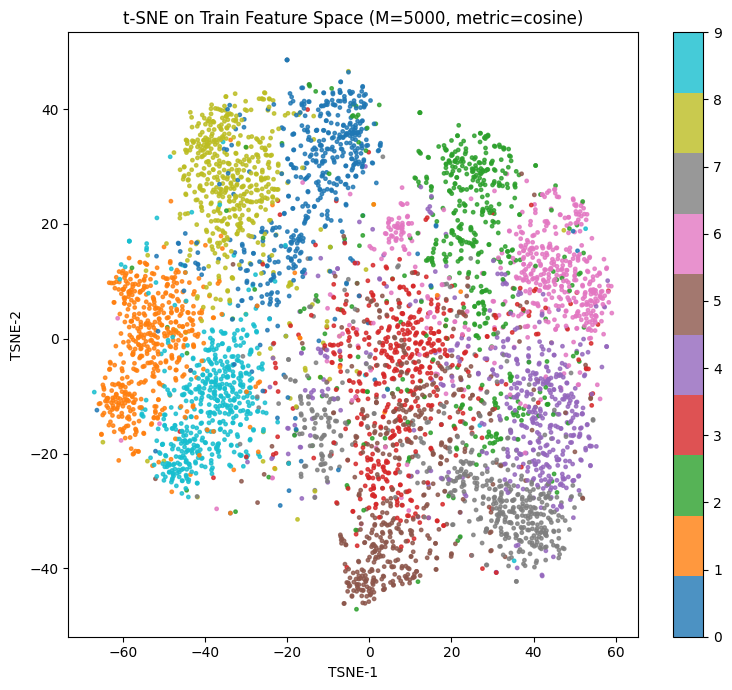

In [28]:
# TO DO


import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# ---- Configs ----
K_LIST = [1, 3, 5, 10]
METRIC = "cosine"          # "cosine" or "euclidean"
BATCH = 1024               # test batch size for KNN
SEED = 42                  # for reproducibility
TSNE_M = 5000              # number of train samples for t-SNE (e.g., 5k)
TSNE_PERPLEXITY = 30

rng = np.random.default_rng(SEED)
device = DEVICE  # from your earlier code

# ---- Helpers ----
def l2_normalize(x: torch.Tensor, eps: float = 1e-12):
    return x / (x.norm(dim=1, keepdim=True) + eps)

@torch.no_grad()
def knn_accuracy(features_train: torch.Tensor,
                 train_labels: torch.Tensor,
                 features_test: torch.Tensor,
                 test_labels: torch.Tensor,
                 ks=(1, 5),
                 metric="cosine",
                 batch_size=1024,
                 device=torch.device("cpu")):
    """
    Classify each test sample by majority vote among k nearest neighbors
    in the *feature space* and report accuracy for each k in ks.
    """
    # Move once; normalize if cosine
    ft = features_train.to(device, non_blocking=True).float()
    fl = train_labels.to(device, non_blocking=True).long()
    fx = features_test.to(device, non_blocking=True).float()
    ty = test_labels.to(device, non_blocking=True).long()

    if metric == "cosine":
        ft = l2_normalize(ft)
        fx = l2_normalize(fx)

    num_classes = int(fl.max().item() + 1)
    max_k = max(ks)

    total = ty.size(0)
    correct = {k: 0 for k in ks}

    # Precompute transpose for cosine sim matmul
    ft_T = ft.t().contiguous() if metric == "cosine" else None

    for start in range(0, total, batch_size):
        end = min(start + batch_size, total)
        xb = fx[start:end]  # (b, N)

        if metric == "cosine":
            # similarity (higher is better)
            sim = xb @ ft_T  # (b, 50000)
            # nearest by highest similarity
            knn_vals, knn_inds = torch.topk(sim, k=max_k, dim=1, largest=True)
        else:
            # Euclidean distance (lower is better); use cdist for clarity
            dists = torch.cdist(xb, ft, p=2)  # (b, 50000)
            knn_vals, knn_inds = torch.topk(dists, k=max_k, dim=1, largest=False)

        neigh_labels = fl[knn_inds]  # (b, max_k)

        # vote for each k
        for k in ks:
            lbls_k = neigh_labels[:, :k]  # (b, k)
            counts = torch.zeros((lbls_k.size(0), num_classes), device=device)
            counts.scatter_add_(1, lbls_k, torch.ones_like(lbls_k, dtype=counts.dtype))
            pred = counts.argmax(dim=1)  # (b,)
            correct[k] += (pred == ty[start:end]).sum().item()

    acc = {k: 100.0 * correct[k] / total for k in ks}
    return acc

# ---- Run KNN accuracy ----
accs = knn_accuracy(
    features_train=features_train,
    train_labels=train_labels,
    features_test=test_features,
    test_labels=test_labels,
    ks=K_LIST,
    metric=METRIC,
    batch_size=BATCH,
    device=device,
)

print("KNN accuracy in feature space:")
for k in K_LIST:
    print(f"  k={k}: {accs[k]:.2f}%")

# Sample TSNE_M random training indices
M = min(TSNE_M, features_train.size(0))
idx = torch.from_numpy(rng.choice(features_train.size(0), size=M, replace=False)).long()
feat_sample = features_train[idx].cpu().numpy().astype(np.float32)  # (M, N)
label_sample = train_labels[idx].cpu().numpy()                       # (M,)

# Optional: normalize before cosine t-SNE
if METRIC == "cosine":
    # L2-normalize rows to unit length
    norms = np.linalg.norm(feat_sample, axis=1, keepdims=True) + 1e-12
    feat_sample = feat_sample / norms

tsne = TSNE(
    n_components=2,
    perplexity=TSNE_PERPLEXITY,
    metric=("cosine" if METRIC == "cosine" else "euclidean"),
    init="pca",
    learning_rate="auto",
    n_iter=1000,
    random_state=SEED,
    verbose=1,
)
feat_2d = tsne.fit_transform(feat_sample)  # (M, 2)

print("t-SNE output shape:", feat_2d.shape)  # should be (M, 2)

# ---- 2D scatter (colored by class) ----
plt.figure(figsize=(8, 7))
scatter = plt.scatter(feat_2d[:, 0], feat_2d[:, 1], c=label_sample, s=6, alpha=0.8, cmap="tab10")
plt.title(f"t-SNE on Train Feature Space (M={M}, metric={METRIC})")
plt.xlabel("TSNE-1")
plt.ylabel("TSNE-2")
plt.colorbar(scatter, ticks=range(int(label_sample.max()+1)))
plt.tight_layout()
plt.show()


### Atenttion in CNN (60 points)

In this section, you should study the following paper and familiarize yourself with various attention methods in convolutional networks. Then:

- **Students whose last two digits of their student ID sum to an odd number** should implement the CA method on both their own model **and** ResNet-18.  
- **Students whose last two digits of their student ID sum to an even number** should implement one of the CBAM methods on both ResNet-18 **and** the model they have designed themselves.

> **Note:** You must achieve an improvement in performance for your work to be graded.

**Paper link:**  
https://iopscience.iop.org/article/10.1088/1742-6596/2171/1/012068/meta


In [29]:
# TO DO
# --- ATTENTION PACK: CBAM + Coordinate Attention, and easy integration helpers ---

import types
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models.resnet import BasicBlock
from torchvision.models import resnet18, ResNet18_Weights


class ChannelAttention(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        hidden = max(8, channels // reduction)
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.mlp = nn.Sequential(
            nn.Conv2d(channels, hidden, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(hidden, channels, 1, bias=False),
        )

    def forward(self, x):
        # shared MLP over avg & max pooled descriptors
        avg = self.mlp(self.avg_pool(x))
        maxv = self.mlp(self.max_pool(x))
        attn = torch.sigmoid(avg + maxv)
        return x * attn


class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super().__init__()
        assert kernel_size in (3, 7)
        padding = 3 if kernel_size == 7 else 1
        self.conv = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)

    def forward(self, x):
        # along channel: [avg, max] -> 7x7 conv -> sigmoid
        avg = torch.mean(x, dim=1, keepdim=True)
        maxv, _ = torch.max(x, dim=1, keepdim=True)
        cat = torch.cat([avg, maxv], dim=1)
        attn = torch.sigmoid(self.conv(cat))
        return x * attn


class CBAM(nn.Module):
    def __init__(self, channels, reduction=16, spatial_kernel=7):
        super().__init__()
        self.ca = ChannelAttention(channels, reduction)
        self.sa = SpatialAttention(spatial_kernel)

    def forward(self, x):
        x = self.ca(x)
        x = self.sa(x)
        return x


# =============================================
# Coordinate Attention (Hou et al., CVPR’21, CA)
# =============================================
class h_swish(nn.Module):
    def forward(self, x):  # fast h-swish
        return x * F.relu6(x + 3, inplace=True) / 6


class CoordinateAttention(nn.Module):
    """
    Factorizes global pooling into two 1D contexts (H and W) to encode
    direction-aware, position-sensitive channel attention.
    Paper: "Coordinate Attention for Efficient Mobile Network Design" (CVPR 2021).
    """
    def __init__(self, channels, reduction=32):
        super().__init__()
        self.channels = channels
        hidden = max(8, channels // reduction)
        self.conv1 = nn.Conv2d(channels, hidden, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(hidden)
        self.act = h_swish()
        self.conv_h = nn.Conv2d(hidden, channels, kernel_size=1, bias=False)
        self.conv_w = nn.Conv2d(hidden, channels, kernel_size=1, bias=False)

    def forward(self, x):
        n, c, h, w = x.size()
        # pool along width and height separately
        x_h = F.adaptive_avg_pool2d(x, (h, 1))        # (N, C, H, 1)
        x_w = F.adaptive_avg_pool2d(x, (1, w))        # (N, C, 1, W)
        x_w = x_w.permute(0, 1, 3, 2)                 # (N, C, W, 1)

        y = torch.cat([x_h, x_w], dim=2)              # (N, C, H+W, 1)
        y = self.conv1(y)
        y = self.bn1(y)
        y = self.act(y)

        y_h, y_w = torch.split(y, [h, w], dim=2)
        y_w = y_w.permute(0, 1, 3, 2)                 # back to (N, hidden, 1, W)

        a_h = torch.sigmoid(self.conv_h(y_h))         # (N, C, H, 1)
        a_w = torch.sigmoid(self.conv_w(y_w))         # (N, C, 1, W)

        out = x * a_h * a_w
        return out



def _wrap_basicblock_with_attention(block: BasicBlock, attn_module: nn.Module):
    """
    Patch a single BasicBlock so that attention is applied to the block's
    conv2->bn2 output (residual branch) before adding the identity.
    """
    block.attn = attn_module

    def forward_with_attn(self, x):
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        # attention on the residual path
        out = self.attn(out)

        if self.downsample is not None:
            identity = self.downsample(x)
        out += identity
        out = self.relu(out)
        return out

    block.forward = types.MethodType(forward_with_attn, block)


def attach_cbam_to_resnet18(model: nn.Module, reduction=16, spatial_kernel=7):
    net = model.module if isinstance(model, nn.DataParallel) else model
    for m in net.modules():
        if isinstance(m, BasicBlock):
            _wrap_basicblock_with_attention(
                m, CBAM(m.bn2.num_features, reduction=reduction, spatial_kernel=spatial_kernel)
            )
    return model


def attach_ca_to_resnet18(model: nn.Module, reduction=32):
    net = model.module if isinstance(model, nn.DataParallel) else model
    for m in net.modules():
        if isinstance(m, BasicBlock):
            _wrap_basicblock_with_attention(
                m, CoordinateAttention(m.bn2.num_features, reduction=reduction)
            )
    return model


def resnet18_with_attention(num_classes=10, which="cbam",
                            weights=ResNet18_Weights.DEFAULT, **attn_kwargs):
    """
    which ∈ {"cbam","ca"}
    Example:
      m = resnet18_with_attention(10, which="cbam", reduction=16, spatial_kernel=7)
    """
    m = resnet18(weights=weights)
    m.fc = nn.Linear(m.fc.in_features, num_classes)
    if which.lower() == "cbam":
        return attach_cbam_to_resnet18(m, **attn_kwargs)
    elif which.lower() == "ca":
        return attach_ca_to_resnet18(m, **attn_kwargs)
    else:
        raise ValueError("which must be 'cbam' or 'ca'")



class CNNWithAttention(nn.Module):
    def __init__(self, num_classes=10, which="cbam",
                 red=16, spatial_kernel=7, ca_red=32):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.bn1   = nn.BatchNorm2d(32)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.bn2   = nn.BatchNorm2d(64)
        self.pool  = nn.MaxPool2d(2, 2)

        # choose attention module
        def make_attn(C):
            if which.lower() == "cbam":
                return CBAM(C, reduction=red, spatial_kernel=spatial_kernel)
            elif which.lower() == "ca":
                return CoordinateAttention(C, reduction=ca_red)
            else:
                return nn.Identity()

        self.attn1 = make_attn(32)
        self.attn2 = make_attn(64)

        self.fc1 = nn.Linear(64 * 8 * 8, 512)  # assuming 32x32 input and two 2x pools
        self.drop = nn.Dropout(0.5)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.bn1(self.conv1(x))))
        x = self.attn1(x)
        x = self.pool(F.relu(self.bn2(self.conv2(x))))
        x = self.attn2(x)
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = self.drop(x)
        return self.fc2(x)



if __name__ == "__main__":
    x = torch.randn(2, 3, 32, 32)
    net_cbam = CNNWithAttention(num_classes=10, which="cbam")
    net_ca   = CNNWithAttention(num_classes=10, which="ca")
    y1 = net_cbam(x); y2 = net_ca(x)
    print("CNN+CBAM:", y1.shape, " CNN+CA:", y2.shape)

    r_cbam = resnet18_with_attention(10, which="cbam")
    r_ca   = resnet18_with_attention(10, which="ca")
    # use 224×224 for pretrained ResNet
    x224 = torch.randn(2, 3, 224, 224)
    print("ResNet+CBAM:", r_cbam(x224).shape, " ResNet+CA:", r_ca(x224).shape)


CNN+CBAM: torch.Size([2, 10])  CNN+CA: torch.Size([2, 10])
ResNet+CBAM: torch.Size([2, 10])  ResNet+CA: torch.Size([2, 10])
